In [1]:
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
from scipy.interpolate import interp1d
import matplotlib.cm as cm
from salishsea_tools import (nc_tools, gsw_calls, geo_tools, viz_tools)
import seabird
import cmocean as cmo
import gsw
from seabird.cnv import fCNV
import pandas as pd
import seaborn as sns
import matplotlib.gridspec as gridspec

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [14]:
NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_2013_T_S_Spice_larger_offshore_rho_correct.nc')


sal = NEP.variables['vosaline']
temp = NEP.variables['votemper']
spic = NEP.variables['spiciness']
rho = NEP.variables['density']

zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]





mask = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/mesh_mask.nc')

tmask = mask.variables['tmask'][0,:32,180:350, 480:650]
umask = mask.variables['umask'][0,:32,180:350, 480:650]
vmask = mask.variables['vmask'][0,:32,180:350, 480:650]
mbathy = mask.variables['mbathy'][0,180:350, 480:650]


y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))



# mbathy[mbathy>32] = 32

In [13]:
temp.shape

(180, 32, 170, 170)

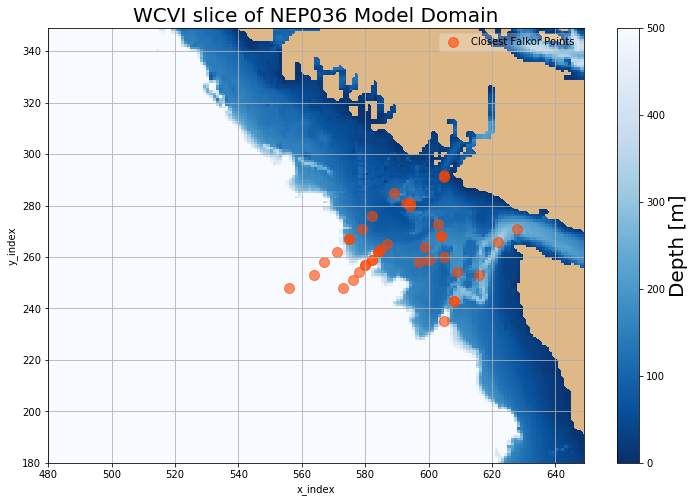

In [7]:
bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


Z = bathy.variables['Bathymetry']

y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


lon = bathy['nav_lon'][180:350, 480:650]
lat = bathy['nav_lat'][180:350, 480:650]

lon_model = bathy['nav_lon'][...]
lat_model = bathy['nav_lat'][...]

y = np.empty_like(lat_location)
x = np.empty_like(lat_location)


for i in np.arange(lat_location.shape[0]):
    y[i], x[i] = geo_tools.find_closest_model_point(
               lon_location[i],lat_location[i],lon_model,lat_model,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    
n = np.empty_like(lat_location)
m = np.empty_like(lat_location)


for i in np.arange(lat_location.shape[0]):
    n[i], m[i] = geo_tools.find_closest_model_point(
               lon_location[i],lat_location[i],lon,lat,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

y = y.astype(int)
x = x.astype(int)

n = n.astype(int)
m = m.astype(int)

cmap = plt.get_cmap('Blues_r')

cmap.set_bad('burlywood')
fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=500)

ax.scatter(x[:], y[:], c='orangered', s=100, alpha=0.6, label = 'Closest Falkor Points')
legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

ax.set_xlabel('x_index')
ax.set_ylabel('y_index')
ax.set_title('WCVI slice of NEP036 Model Domain', fontsize=20)

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
cbar = fig.colorbar(p, ax=ax)
cbar.ax.set_ylabel('Depth [m]', fontsize=20)
ax.grid()

In [25]:
x_wcvi_slice_a = np.arange(560,650)

In [26]:
iso_NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/2013_short_slice_NEP36_along_isopycnal_larger_offshore_rho_correct.nc')

In [27]:
iso_spic = iso_NEP.variables['spiciness']
isot = iso_NEP.variables['isot']
nc_tools.show_variables(iso_NEP)

odict_keys(['x', 'y', 'isot', 'time_counter', 'spiciness', 'temperature', 'salinity'])


In [5]:
isot[4]

26.4

In [6]:
iso_spic.shape

(180, 7, 170, 170)

In [118]:
val_iso

array([[-0.09929691, -0.08131557, -0.06853765, ...,  0.        ,
         0.        ,  0.        ],
       [-0.10598776, -0.08680752, -0.07217097, ...,  0.        ,
         0.        ,  0.        ],
       [-0.11279844, -0.09341124, -0.0767841 , ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [-0.08518907, -0.08230998, -0.08072001, ...,  0.        ,
         0.        ,  0.        ],
       [-0.08783928, -0.08453577, -0.08172873, ...,  0.        ,
         0.        ,  0.        ],
       [-0.09548137, -0.08720519, -0.0840437 , ...,  0.        ,
         0.        ,  0.        ]], dtype=float32)

In [64]:
val_iso = iso_spic[112:123,4,...]
val_iso = np.mean(val_iso, axis=0)

(170, 170)

In [66]:
u_week = u_vel[112:123,20,:,:]
v_week = v_vel[112:123,20,:,:]


u_mean = np.mean(u_week, axis=0)
v_mean = np.mean(v_week, axis=0)
arrow_step = 5

In [67]:
val_iso.shape

(170, 170)

In [68]:
val_iso[np.isnan(val_iso)] = 0

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


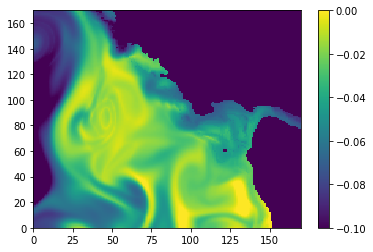

In [69]:
plt.pcolormesh(iso_spic[130,4,...], vmin = -0.1, vmax = 0)
plt.colorbar()

In [101]:
sal_week = sal[112:123,:,:,:]
temp_week = temp[112:123,:,:,:]
spic_week = spic[112:123,:,:,:]
rho_week = spic[112:123,:,:,:]

sal_mean = np.mean(sal_week, axis=0)
temp_mean = np.mean(temp_week, axis=0)
spic_mean = np.mean(spic_week, axis=0)
rho_mean  = np.mean(rho_week, axis=0)


In [170]:
def plot_isopycnal_spice(level_of_currents, t1, t2, iso_level):
    

    val_iso = iso_spic[t1:t2,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    val_iso = np.mean(val_iso, axis=0)




    u_week = u_vel[t1:t2,level_of_currents,:,:]
    v_week = v_vel[t1:t2,level_of_currents,:,:]


    u_mean = np.mean(u_week, axis=0)
    v_mean = np.mean(v_week, axis=0)
    arrow_step = 5




    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))


    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    y = y.astype(int)
    x = x.astype(int)

    n = n.astype(int)
    m = m.astype(int)

    # cmap = plt.get_cmap('Blues')
    cmap = plt.get_cmap(cmo.cm.balance)


    cmap.set_bad('burlywood')
    fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
    # p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=1000)
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
#     CS = ax.contour(x_wcvi_slice,y_wcvi_slice,depth_rho_0, levels =[0, 100, 200, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin=-0.1, vmax=0)
    cbar = fig.colorbar(q, ax=ax)

    u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[...], v_mean[...])
    u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level_of_currents,1:,1:,])
    v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level_of_currents,1:,1:])
    speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)


    # ax.scatter(x[:], y[:], c='orangered', s=100, alpha=0.6, label = 'Closest Falkor Points')
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Spice (26.4 isopycnal) with currents at {d:.2f}m '.format(d = zlevels[level_of_currents]), fontsize=20)

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice_a, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice_a, color='brown')
    # cbar = fig.colorbar(p, ax=ax)
    # cbar.ax.set_ylabel('Depth [m]', fontsize=20)
    ax.grid()


In [2]:
level_of_currents = 0
t1 =90
t2 =120
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

NameError: name 'plot_isopycnal_spice' is not defined

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


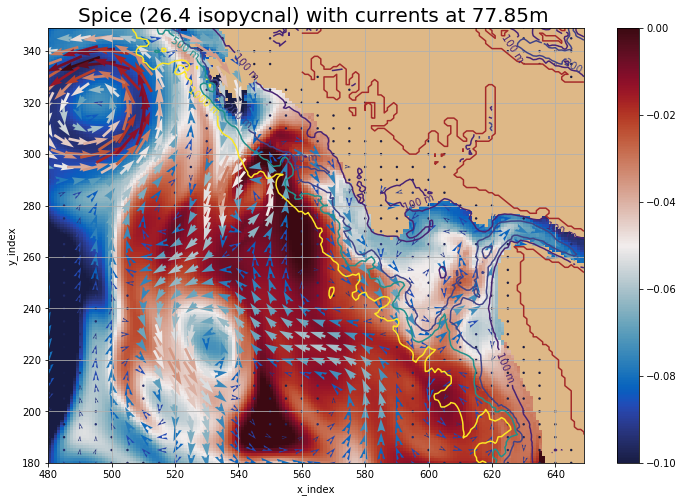

In [148]:
level_of_currents = 20
t1 =112
t2 =123
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


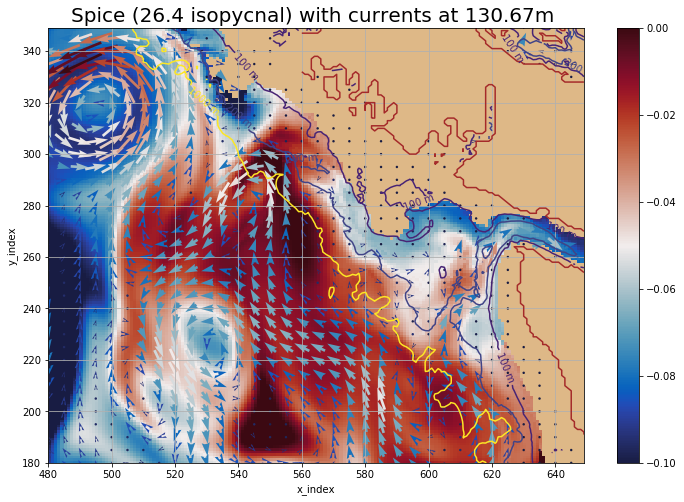

In [118]:
level_of_currents = 23
t1 =112
t2 =123
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


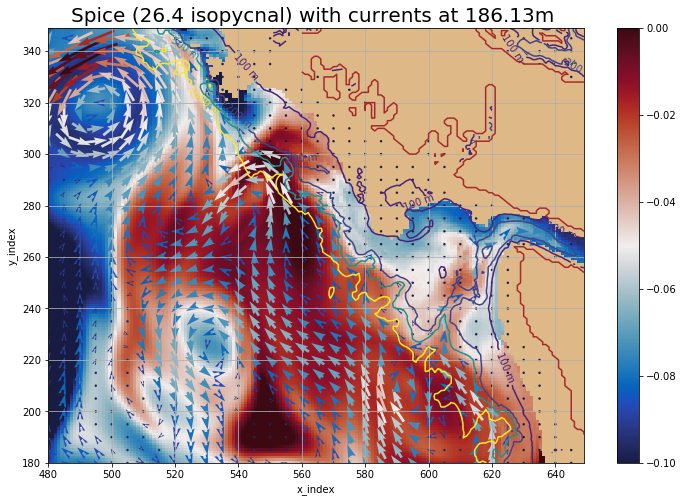

In [172]:
level_of_currents = 25
t1 =112
t2 =123
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


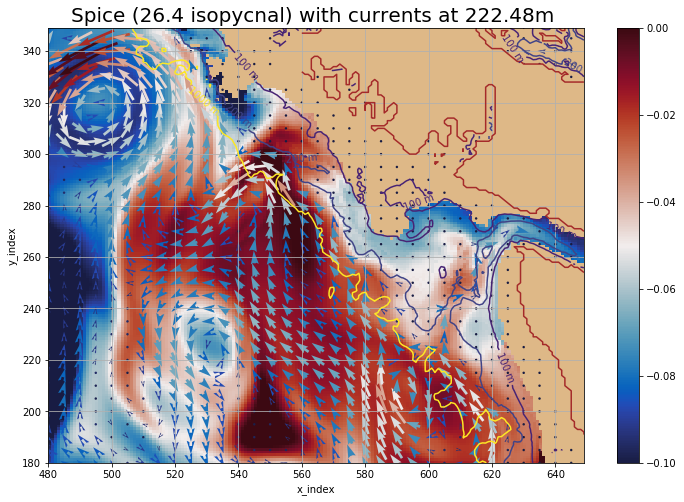

In [98]:
level_of_currents = 26
t1 =112
t2 =123
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

In [103]:
rho_0 = 26.4
depth_rho_0 = np.empty_like(val_iso)


for j in np.arange(y_wcvi_slice.shape[0]):
    for i in np.arange(x_wcvi_slice.shape[0]):
        if mbathy[j,i] > 0:
            depth_rho_0[j, i] = np.interp(rho_0, rho_mean[:mbathy[j, i], j, i]-1000, zlevels[:mbathy[j, i]])

In [125]:
np.min(lat)

47.151363

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/colors.py:860: RuntimeWarning: invalid value encountered in subtract
  resdat -= vmin


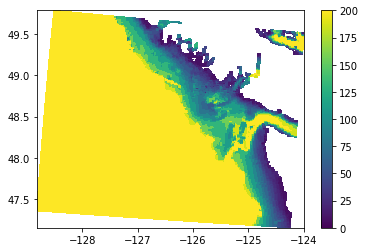

In [128]:
plt.pcolormesh(lon, lat, depth_rho_0, vmin = 0, vmax = 200)
plt.colorbar()

In [161]:
def plot_isopycnal_spice(ax, level_of_currents, t1, t2, iso_level, cmin, cmax):
    
    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)
    

    val_iso = iso_spic[t1:t2,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    val_iso = np.mean(val_iso, axis=0)




    u_week = u_vel[t1:t2,level_of_currents,:,:]
    v_week = v_vel[t1:t2,level_of_currents,:,:]


    u_mean = np.mean(u_week, axis=0)
    v_mean = np.mean(v_week, axis=0)
    arrow_step = 5




    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))


    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    y = y.astype(int)
    x = x.astype(int)

    n = n.astype(int)
    m = m.astype(int)

    # cmap = plt.get_cmap('Blues')
    cmap = plt.get_cmap(cmo.cm.balance)


    cmap.set_bad('burlywood')
    # p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=1000)
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
#     CS = ax.contour(x_wcvi_slice,y_wcvi_slice,depth_rho_0, levels =[0, 100, 200, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin=cmin, vmax=cmax)
#     cbar = fig.colorbar(q, ax=ax)

    u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[...], v_mean[...])
    u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[10,1:,1:,])
    v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[10,1:,1:])
    speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)


    # ax.scatter(x[:], y[:], c='orangered', s=100, alpha=0.6, label = 'Closest Falkor Points')
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Spice (26.4 isopycnal) with currents at {d:.2f}m '.format(d = zlevels[level_of_currents]), fontsize=20)

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice_a, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice_a, color='brown')
    # cbar = fig.colorbar(p, ax=ax)
    # cbar.ax.set_ylabel('Depth [m]', fontsize=20)
    ax.grid()
    return ax, q


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


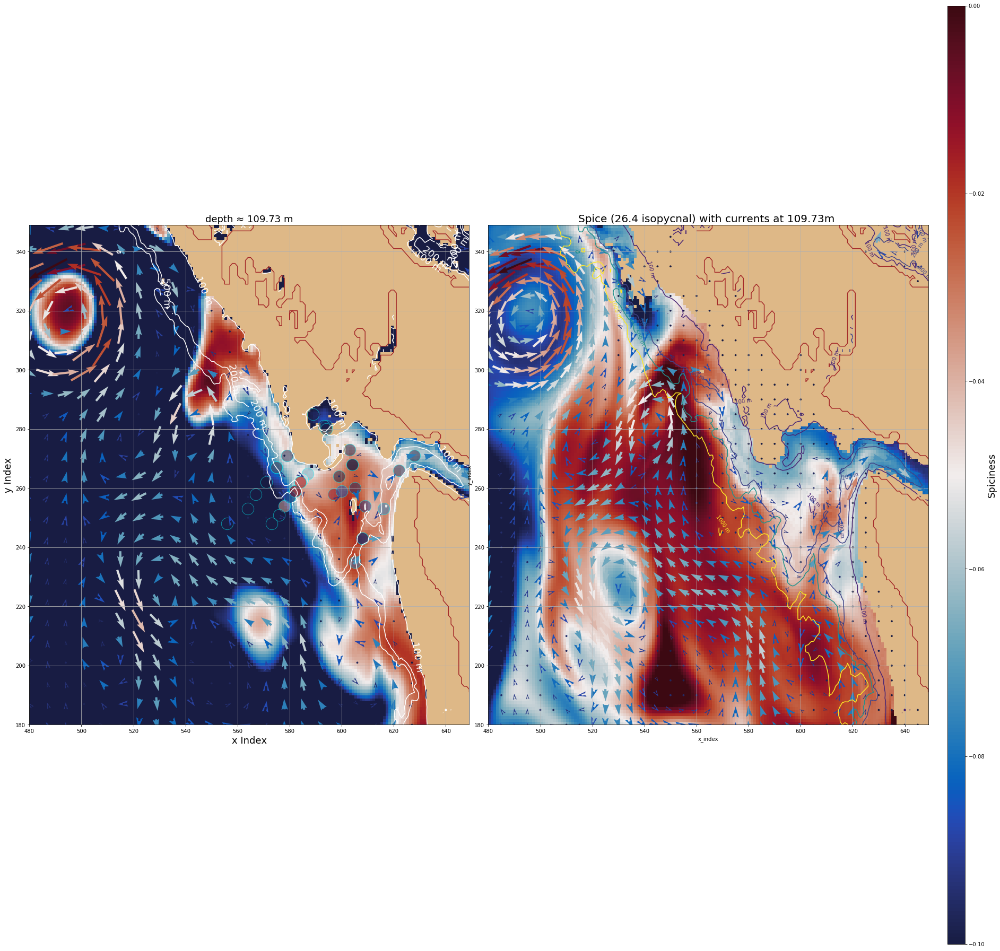

In [166]:
level_of_currents = 22
t1 =112
t2 =123
iso_level = 4



fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0], mesh = plot_spic_subplot(level= 22, ax= axs[0], cmin = -0.1, cmax = 0)
axs[1], mesh = plot_isopycnal_spice(axs[1], level_of_currents, t1, t2, iso_level, cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[2])
cbar.set_label(label='Spiciness', fontsize = 18)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


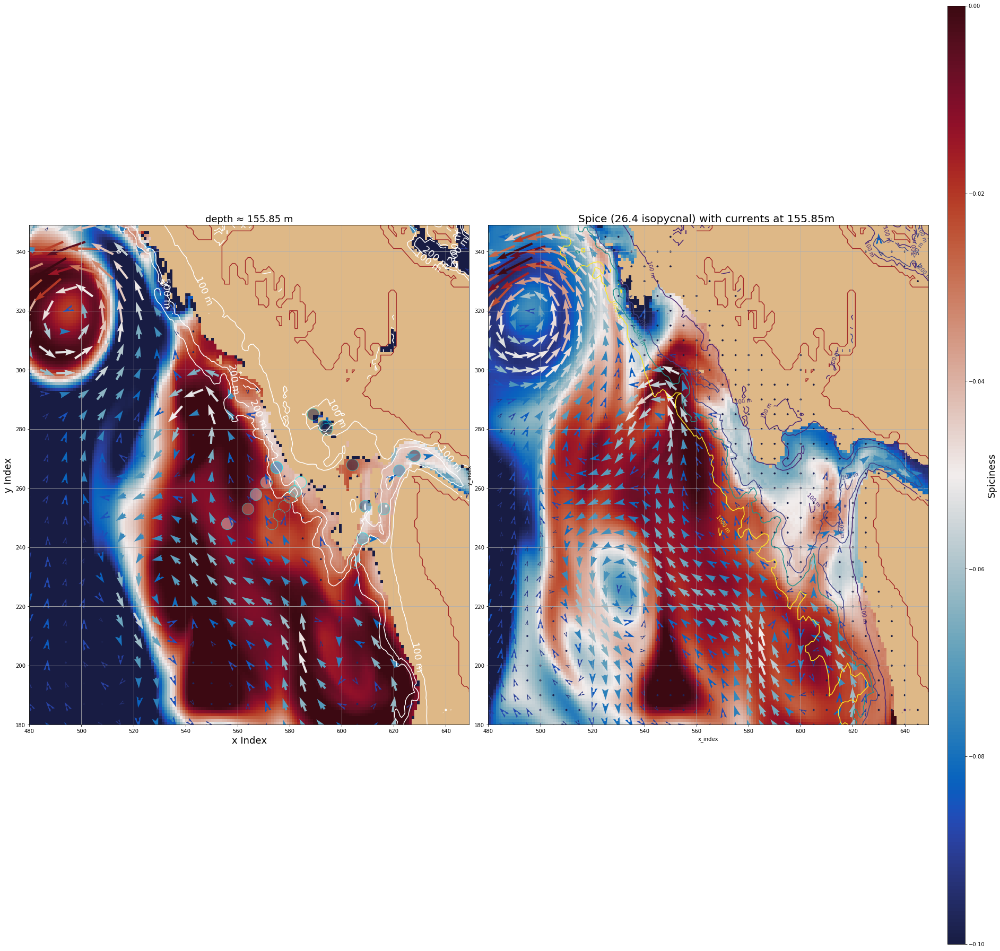

In [167]:
level_of_currents = 24
t1 =112
t2 =123
iso_level = 4



fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0], mesh = plot_spic_subplot(level= 24, ax= axs[0], cmin = -0.1, cmax = 0)
axs[1], mesh = plot_isopycnal_spice(axs[1], level_of_currents, t1, t2, iso_level, cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[2])
cbar.set_label(label='Spiciness', fontsize = 18)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


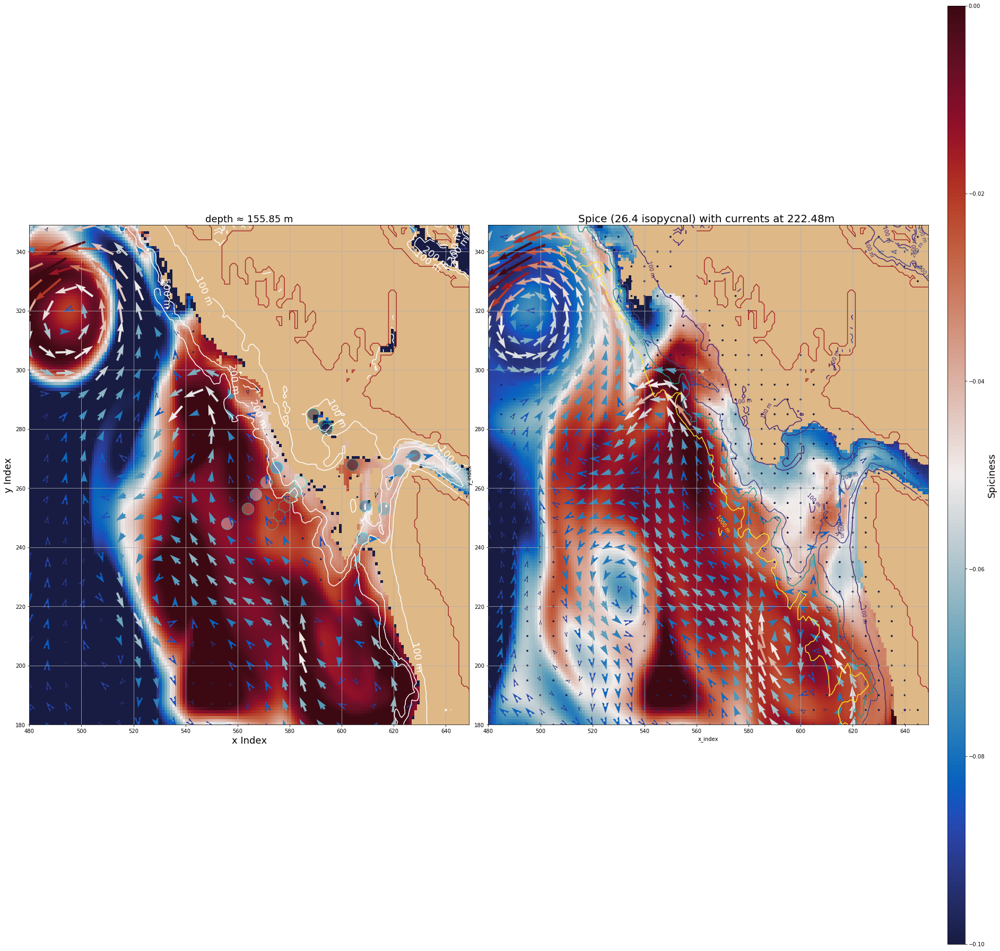

In [168]:
level_of_currents = 26
t1 =112
t2 =123
iso_level = 4



fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0], mesh = plot_spic_subplot(level= 24, ax= axs[0], cmin = -0.1, cmax = 0)
axs[1], mesh = plot_isopycnal_spice(axs[1], level_of_currents, t1, t2, iso_level, cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[2])
cbar.set_label(label='Spiciness', fontsize = 18)


In [142]:
axs.shape

(3,)

In [3]:
def U_timeseries_at_WCVI_locations(grid_U):
    
    u_vel = grid_U.variables['uo'][:,:,1:,1:]

    
    vector_u = namedtuple('vector_u', 'u_vel')

    return vector_u(u_vel)


def V_timeseries_at_WCVI_locations(grid_V):
    
    v_vel = grid_V.variables['vo'][:,:,1:,1:]

    
    vector_v = namedtuple('vector_v', 'v_vel')

    return vector_v(v_vel)

In [4]:
from __future__ import division
import glob
import os
import fnmatch
from collections import namedtuple, OrderedDict

import os


u_vel = np.empty((180,zlevels.shape[0],y_wcvi_slice.shape[0],x_wcvi_slice.shape[0]))
v_vel = np.empty((180,zlevels.shape[0],y_wcvi_slice.shape[0],x_wcvi_slice.shape[0]))



i = 0

for file in sorted(glob.glob('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d*grid_U*.nc')):
    vector_u = U_timeseries_at_WCVI_locations(nc.Dataset(file))
    u_vel[i:i+10,...] = vector_u[0]
    i = i+10

j = 0
for file in sorted(glob.glob('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d*grid_V*.nc')):
    vector_v = V_timeseries_at_WCVI_locations(nc.Dataset(file))
    v_vel[j:j+10,...] = vector_v[0]
    j = j+10
    

In [133]:
u_week = u_vel[112:123,:,:,:]
v_week = v_vel[112:123,:,:,:]


u_mean = np.mean(u_week, axis=0)
v_mean = np.mean(v_week, axis=0)



In [134]:
# u_vel = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_U_20130817-20130826.nc').variables['uo']#[:,:,1:,1:]
# v_vel = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_V_20130817-20130826.nc').variables['vo']#[:,:,1:,1:]

# u_mean = np.mean(u_vel, axis=0)
# v_mean = np.mean(v_vel, axis=0)

In [135]:
def plot_spic_subplot(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})


    spic_tzyx = spic_mean[level,...]
    spic_tzyx = np.ma.masked_array(spic_tzyx, mask= 1- tmask[level,...])

#     tra_tzyx = tracer_mean[level,...]
#     tra_tzyx = np.ma.masked_array(tra_tzyx, mask= 1- tmask[level,...])


    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, spic_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                spic_falkor_depth = spic_falk_loc[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = spic_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5,edgecolor= 'cyan' )#, label = 'Closest Falkor Points')


    u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
    u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
    v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
    speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    


    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    ax.grid()
    return ax, mesh

def plot_temp_subplot(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})



    temp_tzyx = temp_mean[level,...]
    temp_tzyx = np.ma.masked_array(temp_tzyx, mask= 1- tmask[level,...])



    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, temp_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                temp_falkor_depth = temp_location[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = temp_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5, edgecolor= 'cyan')#, label = 'Closest Falkor Points')


    u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
    u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
    v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
    speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)


    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    ax.grid()
    return ax, mesh


def plot_sal_subplot(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})



    sal_tzyx = sal_mean[level,...]
    sal_tzyx = np.ma.masked_array(sal_tzyx, mask= 1- tmask[level,...])



    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, sal_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                sal_falkor_depth = sal_location[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = sal_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5,edgecolor='cyan')#, label = 'Closest Falkor Points')


    u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
    u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
    v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
    speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)


    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    ax.grid()
    return ax, mesh







/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


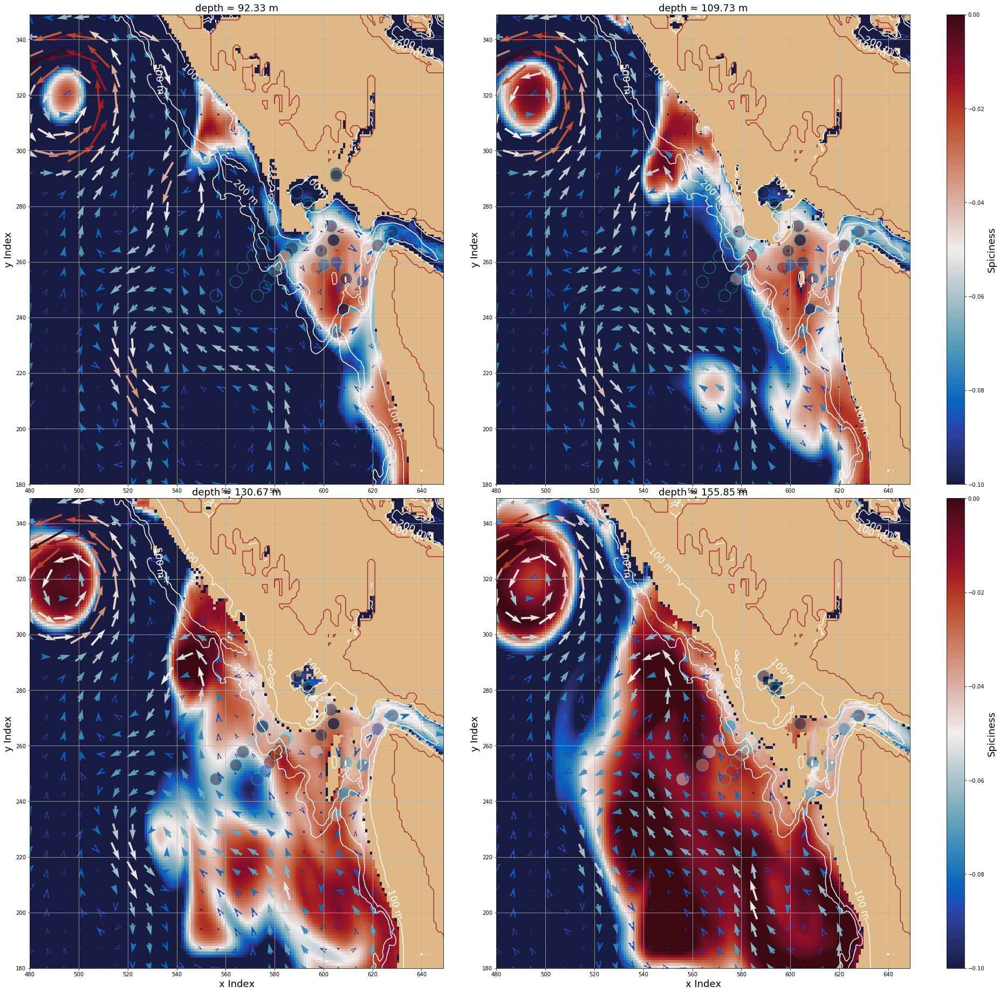

In [89]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 21, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 22, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot(level= 23, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 24, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


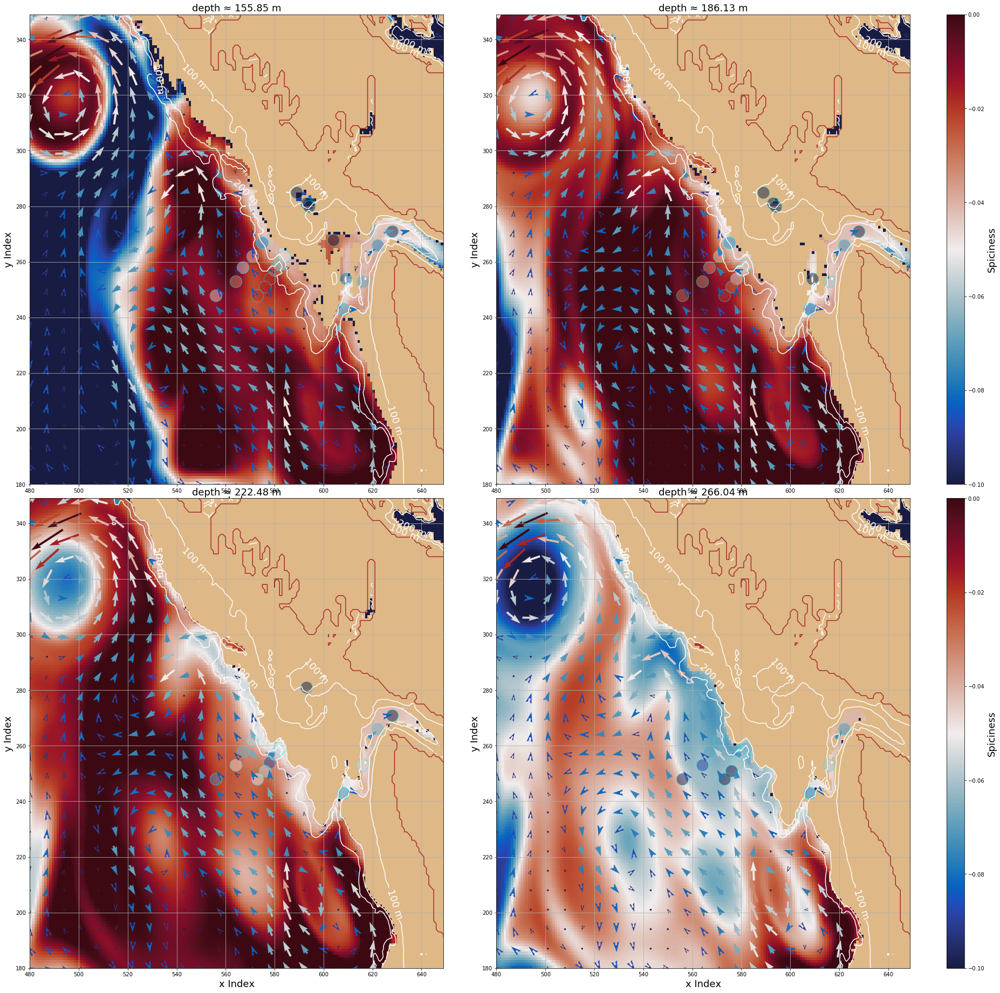

In [98]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 24, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 25, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot(level= 26, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 27, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


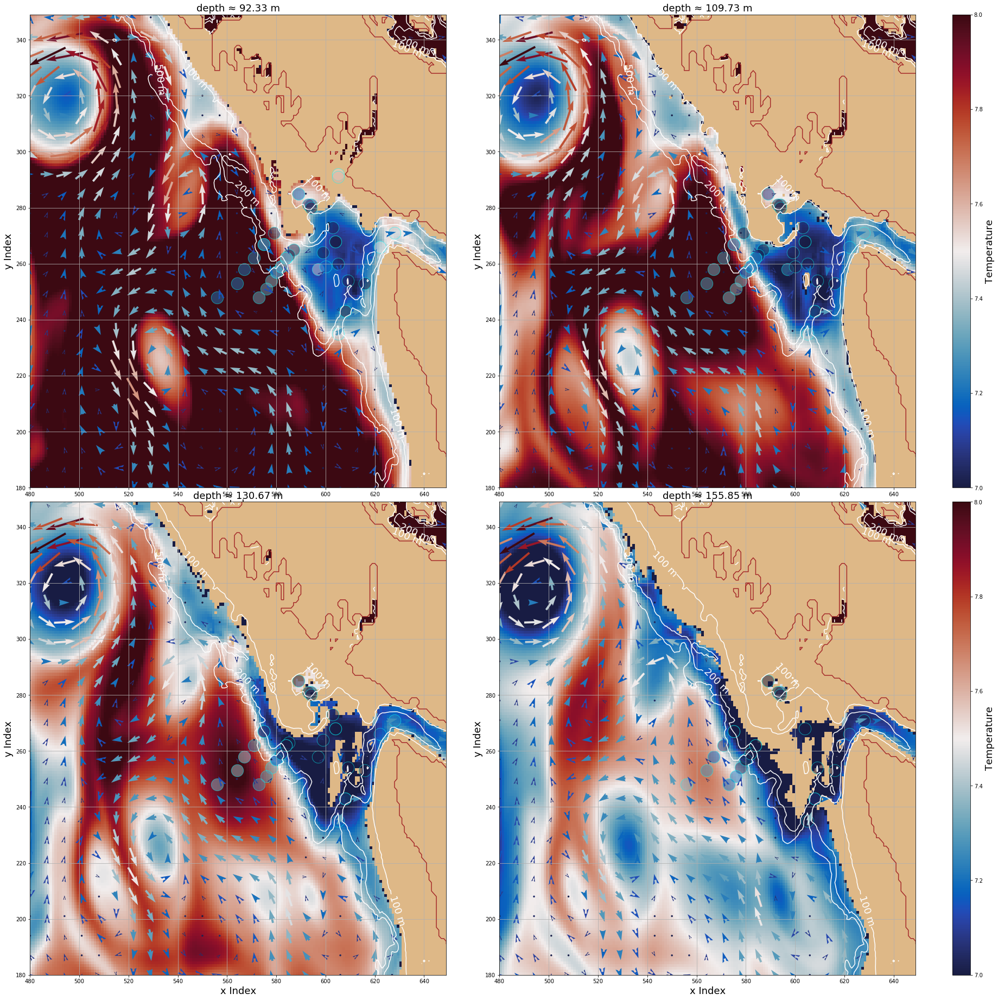

In [91]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_temp_subplot(level= 21, ax= axs[0,0], cmin = 7, cmax = 8)
axs[0,1], mesh = plot_temp_subplot(level= 22, ax= axs[0,1], cmin = 7, cmax = 8)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Temperature', fontsize = 18)

axs[1,0], mesh = plot_temp_subplot(level= 23, ax= axs[1,0], cmin = 7, cmax = 8)
axs[1,1], mesh = plot_temp_subplot(level= 24, ax= axs[1,1], cmin = 7, cmax = 8)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Temperature', fontsize = 18)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


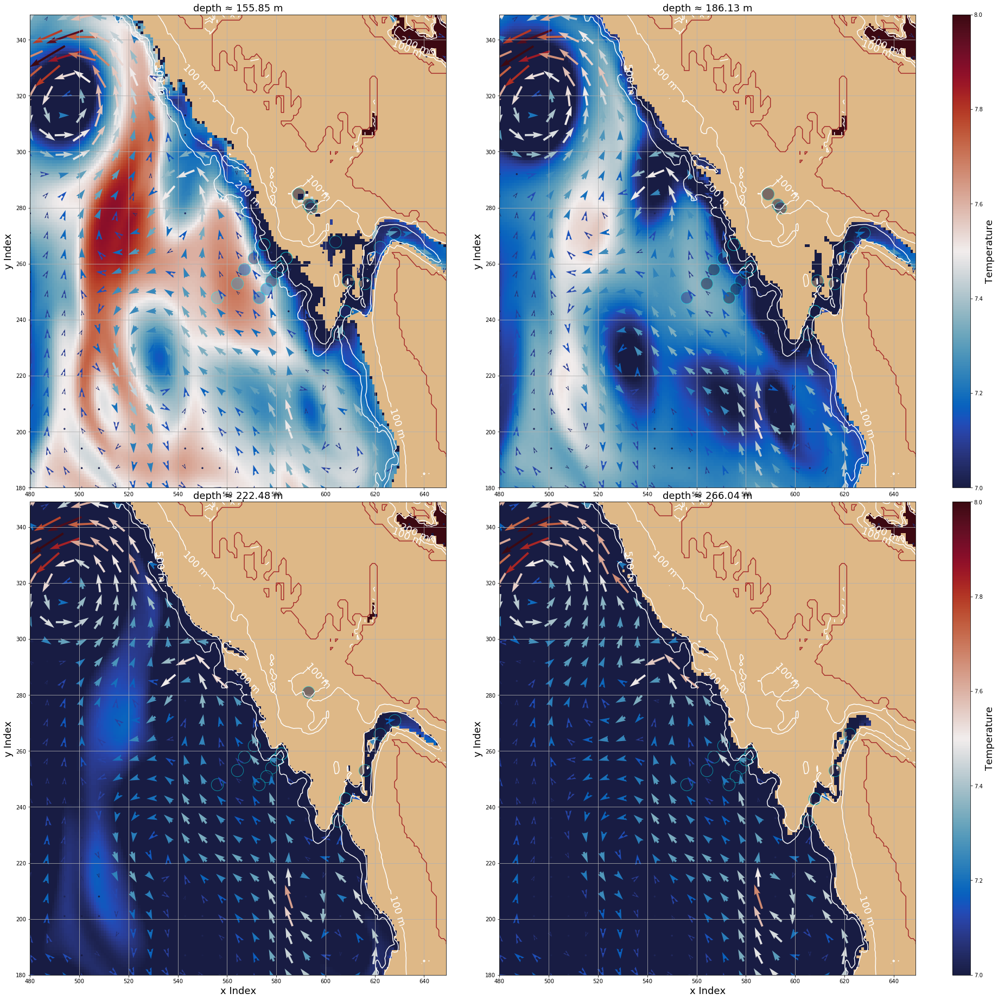

In [92]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_temp_subplot(level= 24, ax= axs[0,0], cmin = 7, cmax = 8)
axs[0,1], mesh = plot_temp_subplot(level= 25, ax= axs[0,1], cmin = 7, cmax = 8)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Temperature', fontsize = 18)

axs[1,0], mesh = plot_temp_subplot(level= 26, ax= axs[1,0], cmin = 7, cmax = 8)
axs[1,1], mesh = plot_temp_subplot(level= 27, ax= axs[1,1], cmin = 7, cmax = 8)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Temperature', fontsize = 18)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


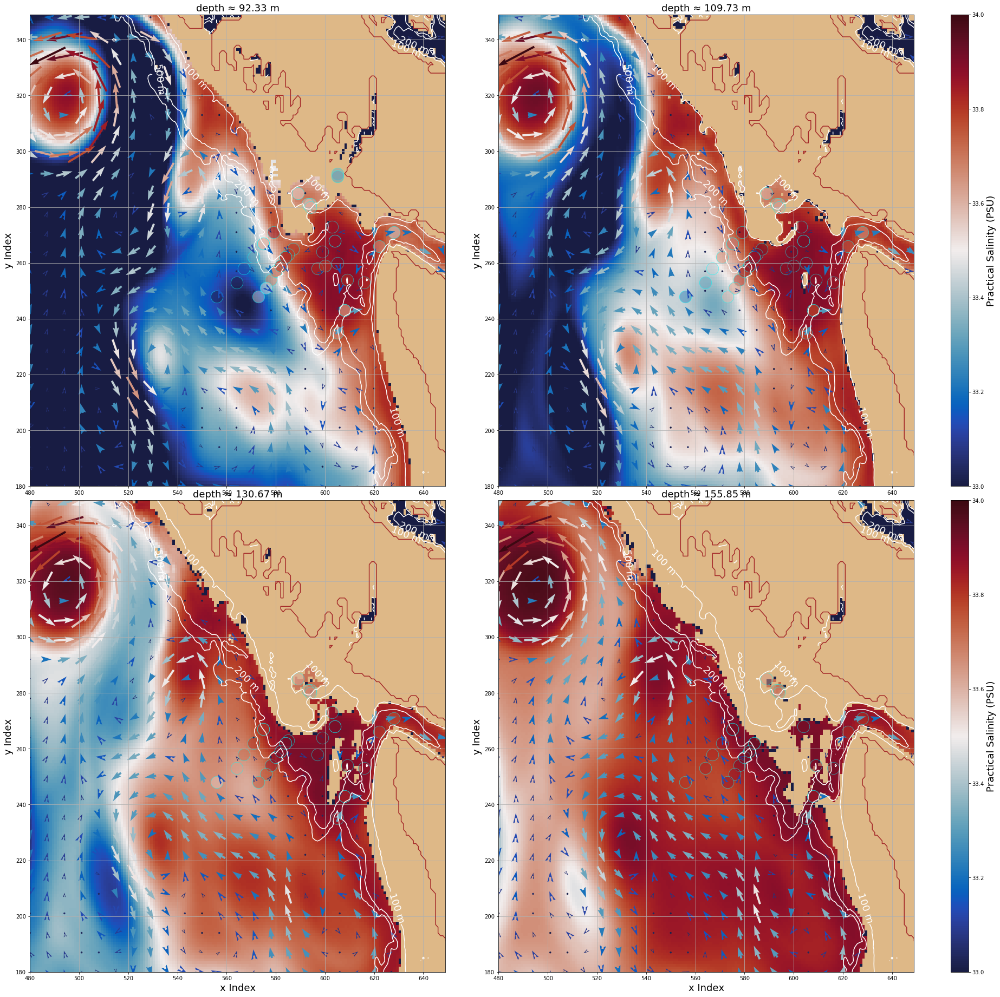

In [93]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_sal_subplot(level= 21, ax= axs[0,0], cmin = 33, cmax = 34)
axs[0,1], mesh = plot_sal_subplot(level= 22, ax= axs[0,1], cmin = 33, cmax = 34)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)

axs[1,0], mesh = plot_sal_subplot(level= 23, ax= axs[1,0], cmin = 33, cmax = 34)
axs[1,1], mesh = plot_sal_subplot(level= 24, ax= axs[1,1], cmin = 33, cmax = 34)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


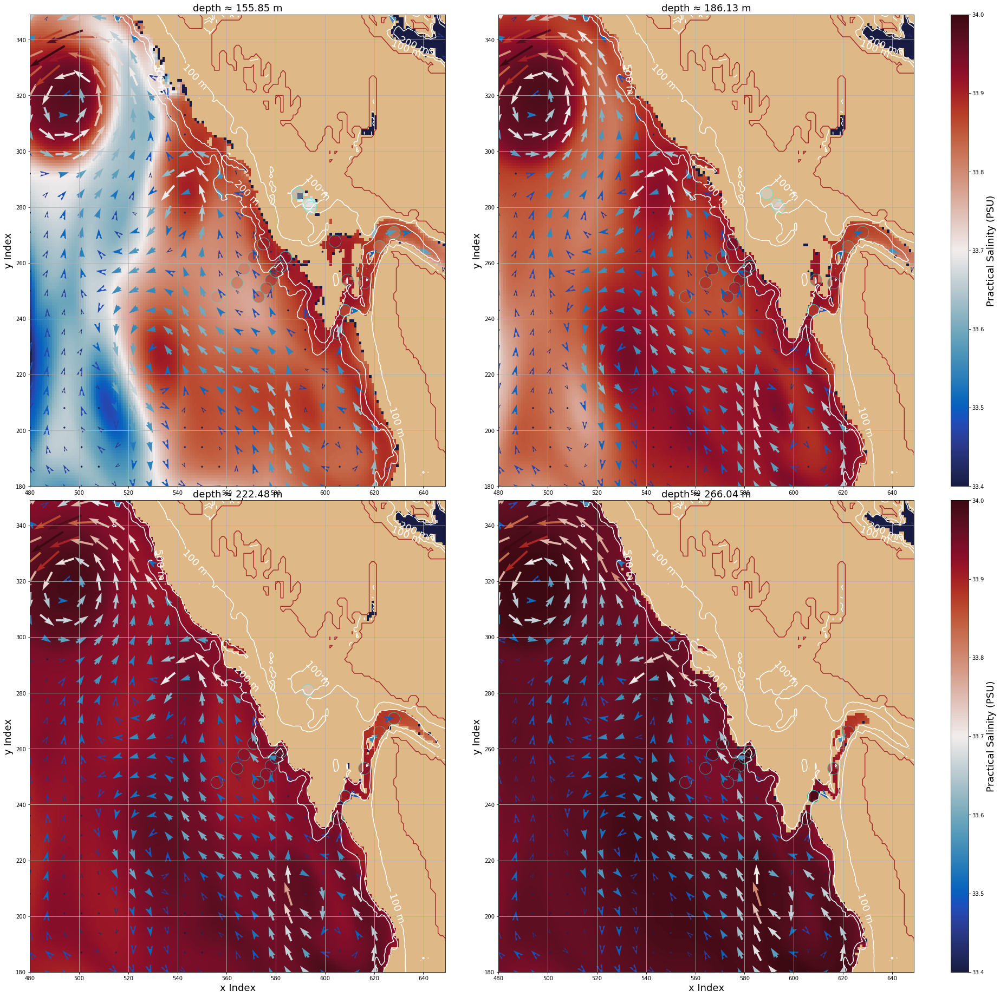

In [94]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_sal_subplot(level= 24, ax= axs[0,0], cmin = 33.4, cmax = 34)
axs[0,1], mesh = plot_sal_subplot(level= 25, ax= axs[0,1], cmin = 33.4, cmax = 34)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)

axs[1,0], mesh = plot_sal_subplot(level= 26, ax= axs[1,0], cmin = 33.4, cmax = 34)
axs[1,1], mesh = plot_sal_subplot(level= 27, ax= axs[1,1], cmin = 33.4, cmax = 34)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


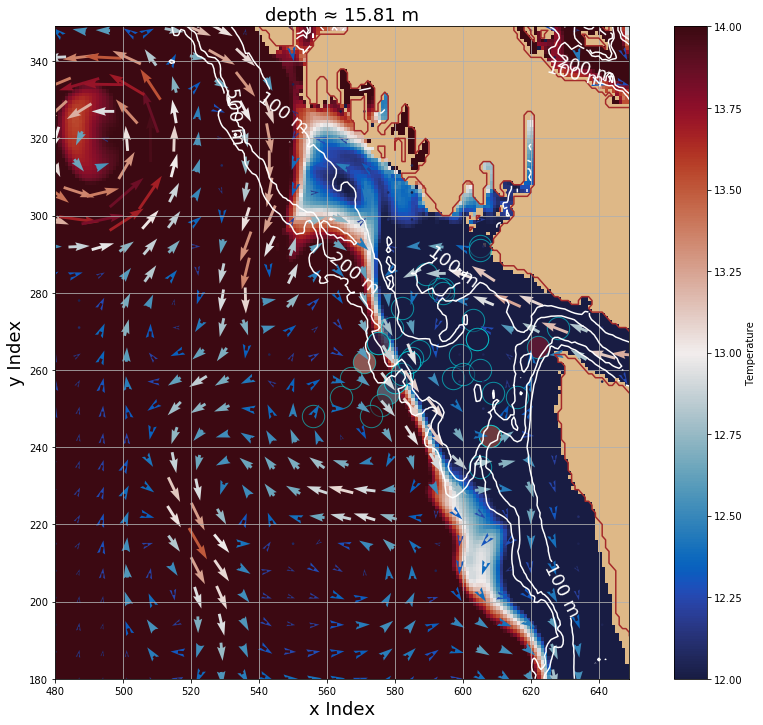

In [99]:
fig, axs = plt.subplots(1, 1, figsize=(16,12))

axs, mesh = plot_temp_subplot(level= 10, ax= axs, cmin = 12, cmax = 14)
cbar = fig.colorbar(mesh, ax=axs, label='Temperature')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


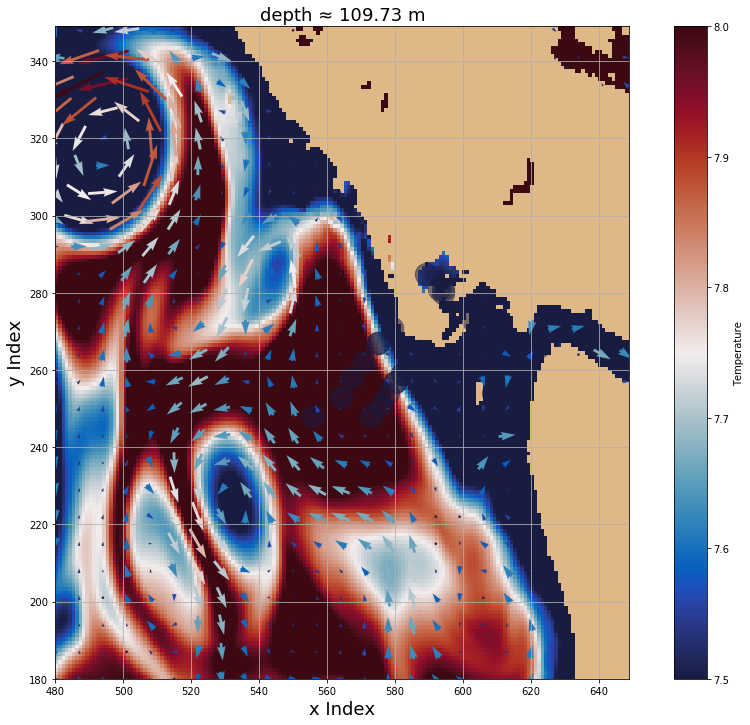

In [54]:
fig, axs = plt.subplots(1, 1, figsize=(16,12))

axs, mesh = plot_temp_subplot(level= 22, ax= axs, cmin = 7.5, cmax = 8)
cbar = fig.colorbar(mesh, ax=axs, label='Temperature')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


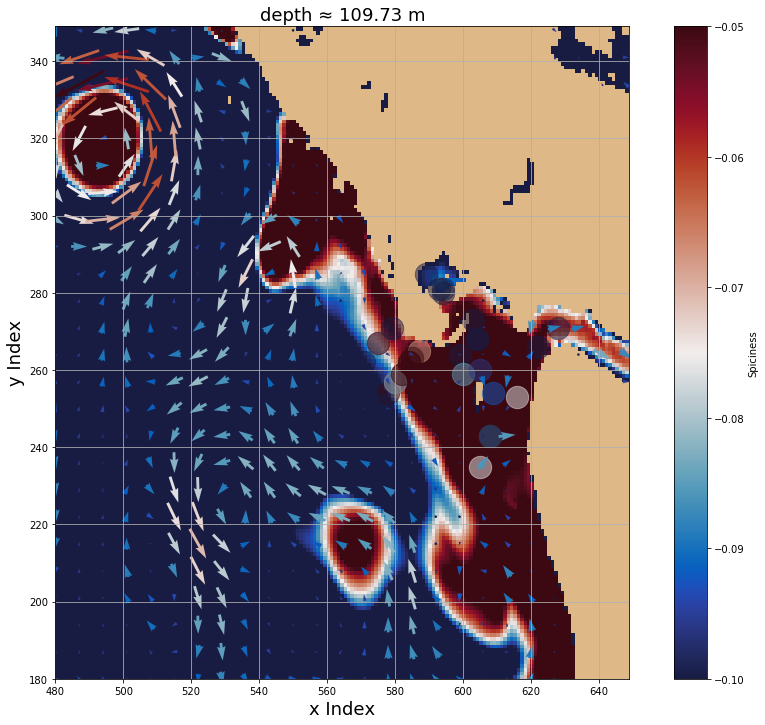

In [61]:
fig, axs = plt.subplots(1, 1, figsize=(16,12))

axs, mesh = plot_spic_subplot(level= 22, ax= axs, cmin = -0.1, cmax = -0.05)
cbar = fig.colorbar(mesh, ax=axs, label='Spiciness')

In [72]:

lon_W01 = -124.82500
lat_W01 = 48.31500

y, x = geo_tools.find_closest_model_point(lon_W01,lat_W01,\
                                          lon_model,lat_model,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})      

print(y, x)

lon_W02 = -124.89500
lat_W02 = 48.04167

y, x = geo_tools.find_closest_model_point(lon_W02,lat_W02,\
                                          lon_model,lat_model,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

print(y, x)

259 623
239 622


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


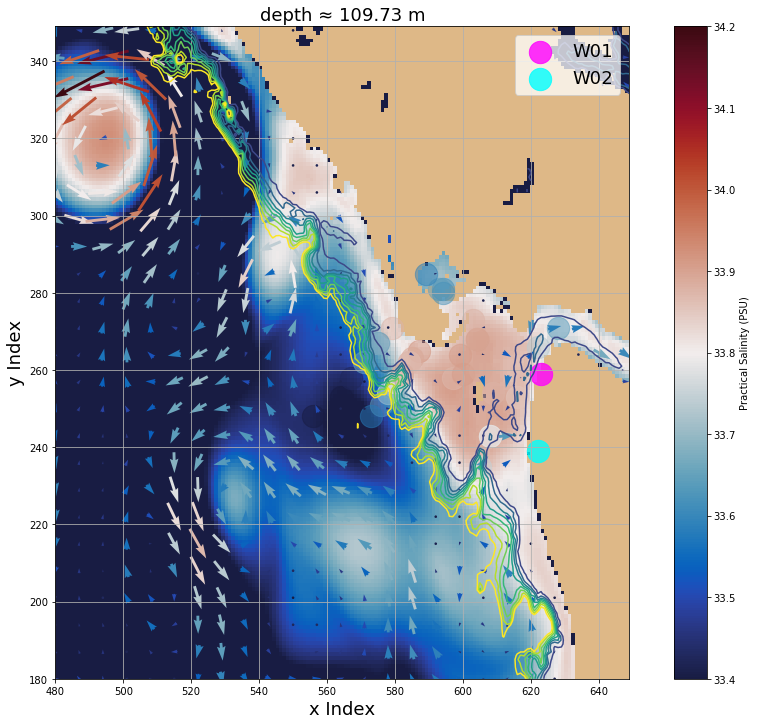

In [25]:
fig, axs = plt.subplots(1, 1, figsize=(16,12))

axs, mesh = plot_sal_subplot(level= 22, ax= axs, cmin = 33.4, cmax = 34.2)
cbar = fig.colorbar(mesh, ax=axs, label='Practical Salinity (PSU)')
axs.scatter(623, 259, s=500, c= 'magenta', alpha=0.8, label = 'W01')
axs.scatter(622, 239, s=500, c= 'cyan', alpha=0.8, label = 'W02')
legend = axs.legend(loc='best', fancybox=True, framealpha=0.75, fontsize = 18)
axs.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels = [200, 300, 400, 500, 600, 700, 800, 900])

In [4]:
def falkor_locations(profile):

    pressure = profile['PRES'][:]
    PT = profile['potemperature'][:]
    T = profile['TEMP'][:]
    SP = profile['PSAL'][:]
    lat = np.nanmean(profile['LATITUDE'][:])
    lon = np.nanmean(profile['LONGITUDE'][:])
    
    z = gsw.z_from_p(-pressure, lat)
    
    falkor_scalar_ts = namedtuple('falkor_scalar_ts', 'temp, sal, lat, lon, z')

    return falkor_scalar_ts(PT, SP, lat, lon, z)

In [5]:
from __future__ import division
import glob
import os
import fnmatch
from collections import namedtuple, OrderedDict

import os


file = []

i = 0
for file_number in sorted(glob.glob('/home/ssahu/saurav/Falkor_code/*.cnv')):
    
    file.append(file_number)
    
    i = i+1


In [8]:
temp_location = []
sal_location = []
lat_location = []
lon_location = []
z_location = []
# sal_location[j,:] = falkor_scalar_ts[1]
# lat_location[j] = falkor_scalar_ts[2]
# lon_location[j] = falkor_scalar_ts[3]


time_location = []

for example in file:
    time_location = np.append(arr= time_location, values= example[51:-4])
    
time_location = time_location.astype(int)
time_location[:] = time_location[:] + 112 

for j in np.arange(len(file)):

    falkor_scalar_ts = falkor_locations(fCNV(file[j]))
    
    
    temp_that_file = np.empty(falkor_scalar_ts[0].shape)
    temp_that_file = falkor_scalar_ts[0]
    temp_location.append(temp_that_file)
    
    sal_that_file = np.empty(falkor_scalar_ts[1].shape)
    sal_that_file = falkor_scalar_ts[1]
    sal_location.append(sal_that_file)
    
    
    z_that_file = np.empty(falkor_scalar_ts[4].shape)
    z_that_file = falkor_scalar_ts[4]
    z_location.append(z_that_file)    
    
    lat_that_file = np.empty(falkor_scalar_ts[2].shape)
    lat_that_file = falkor_scalar_ts[2]
    lat_location.append(lat_that_file)
    
    lon_that_file = np.empty(falkor_scalar_ts[3].shape)
    lon_that_file = falkor_scalar_ts[3]
    lon_location.append(lon_that_file)
    
    
    

    
temp_location = np.array(temp_location)
sal_location = np.array(sal_location)
z_location = np.array(z_location)
lat_location = np.array(lat_location)
lon_location = np.array(lon_location)



DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD002_20130819.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD003_20130819.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD004_20130819.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD005_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD006_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD007_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD008_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD009_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD010_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD011_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD012_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD013_20130

In [54]:
SA_falk_loc = np.empty_like(sal_location)
CT_falk_loc = np.empty_like(temp_location)
pressure_falk_loc = np.empty_like(z_location)
spic_falk_loc = np.empty_like(sal_location)
rho_falk_loc = np.empty_like(sal_location)



for i in np.arange(lat_location.shape[0]):
    
    pressure_falk_loc[i] = gsw.p_from_z(-z_location[i],lat_location[i])
    
    SA_falk_loc[i] = gsw.SA_from_SP(sal_location[i], pressure_falk_loc[i], lon_location[i], lat_location[i])
    
    CT_falk_loc[i] = gsw.CT_from_pt(sal_location[i], temp_location[i])
    
    spic_falk_loc[i] = gsw.spiciness0(SA_falk_loc[i], CT_falk_loc[i])
    
    rho_falk_loc[i]  = gsw.density.rho(SA_falk_loc[i], CT_falk_loc[i], 0) -1000

    

In [67]:
def spice_bathy_plot_date(t, level, file_number):
    spic_tzyx = spic[t,level,...]
    spic_tzyx = np.ma.masked_array(spic_tzyx, mask= 1- tmask[level,...])


    fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(16,8)); ax1.grid()
    viz_tools.set_aspect(ax1)
    cmap = plt.get_cmap('Blues_r')
    cmap.set_bad('burlywood')
    p = ax1.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0)#, vmax=500)
    ax1.scatter(x[file_number], y[file_number], c='orangered', s=100, alpha=0.6, label = 'Falkor Point')
    legend = ax1.legend(loc='best', fancybox=True, framealpha=0.25)
    ax1.set_xlabel('x Index',fontsize=18)
    ax1.set_ylabel('y Index',fontsize=18)
    # ax.set_ylim([lat[270:350,550:650].min(), lat[270:350,550:650].max()])
    ax1.set_title('WCVI slice of NEP036 Model Domain', fontsize=20)
    # viz_tools.plot_land_mask(ax1, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    cbar = fig.colorbar(p, ax=ax1, label='Depth [m]')



    viz_tools.set_aspect(ax2)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax2.pcolormesh(x_wcvi_slice,y_wcvi_slice, spic_tzyx, cmap=cmap, vmin = -0.1, vmax = -0.05)

    viz_tools.plot_land_mask(ax2, bathy, xslice=x_wcvi_slice, yslice=y_wcvi_slice, color='burlywood')
    ax2.scatter(x[file_number], y[file_number], c='cyan', s=100, alpha=0.6, label = 'Falkor Point')
    ax2.grid()
    # ax2.set_xlim(x_wcvi_slice[0], x_wcvi_slice[-1])
    # ax2.set_ylim(y_wcvi_slice[0], y_wcvi_slice[-1])
    ax2.set_xlabel('x Index',fontsize=18)
    ax2.set_ylabel('y Index',fontsize=18)
    if t <= 1:
        month = 'April'
        ax2.set_title('{0} April 2013, depth \u2248 {d:.2f} m'.format(t+29, d=zlevels[level]))

    if 1 < t <=32:
        month = 'May'
        ax2.set_title('{0} May 2013, depth \u2248 {d:.2f} m'.format(t-1, d=zlevels[level]))

    if 32 < t <= 62:
        month = 'June'
        ax2.set_title('{0} June 2013, depth \u2248 {d:.2f} m'.format(t-32, d=zlevels[level]))

    if 62 < t <= 93:
        month = 'July'
        ax2.set_title('{0} July 2013, depth \u2248 {d:.2f} m'.format(t-62, d=zlevels[level]))

    if 93 < t <= 124:
        month = 'August'
        ax2.set_title('{0} August 2013, depth \u2248 {d:.2f} m'.format(t-93, d=zlevels[level]))

    if 124 < t <= 154:
        month = 'September'
        ax2.set_title('Spiciness on {0} September 2013, at isopycnal level of \u2248 {d:.2f} '.format(t-114, d=zlevels[level]))

    if 154 < t <= 185:
        month = 'October'
        ax2.set_title('Spiciness on {0} October 2013, at isopycnal level of \u2248 {d:.2f} '.format(t-154, d=zlevels[level]))


    # ax2.set_title('{0} August 2015, depth \u2248 {d:.2f} m'.format(t_aug+1, d=zlevels[level], z=zlevels),fontsize=18)
    cbar = fig.colorbar(mesh, ax=ax2, label='Spiciness')
    legend = ax2.legend(loc='best', fancybox=True, framealpha=0.25)
    
def compare_plots(t, file_number):
    temp_position = temp[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]
    sal_position  = sal[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]
    spic_position = spic[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]
    rho_position  = rho[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]



    fig2, (ax2, ax3, ax4) = plt.subplots(1,3,sharey=True,figsize=(15,8))
    # Temperature
    ax2.plot(temp_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax2.plot(temp_location[file_number],z_location[file_number],'b',label='Falkor data')
    ax2.set_ylabel('Depth (m)')
    ax2.set_ylim(ax2.get_ylim()[::-1]) 
    ax2.set_xlabel('Temperature (C)')
    ax2.xaxis.set_label_position('top') 
    ax2.xaxis.set_ticks_position('top') 
    legend = ax2.legend(loc='best', fancybox=True, framealpha=0.25)
    # Salinity
    ax3.plot(sal_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax3.plot(sal_location[file_number],z_location[file_number],'b',label='Falkor data')
    ax3.set_xlabel('Salinity')
    ax3.xaxis.set_label_position('top') 
    ax3.xaxis.set_ticks_position('top') 
    ax3.yaxis.set_visible(False) 
    legend = ax3.legend(loc='best', fancybox=True, framealpha=0.25)
#     # Spiciness
#     ax4.plot(spic_position,zlevels[:mbathy[y[file_number],x[file_number]]],'r',label = 'NEP36 model')
#     ax4.plot(spic_falk_loc[file_number],z_location[file_number],'b',label='Falkor data')
#     ax4.set_xlabel('Spiciness')
#     ax4.set_xlim(-1.2,0)
#     ax4.xaxis.set_label_position('top') 
#     ax4.xaxis.set_ticks_position('top') 
#     ax4.yaxis.set_visible(False) 
#     legend = ax4.legend(loc='best', fancybox=True, framealpha=0.25)

    # Density
    ax4.plot(spic_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax4.plot(spic_falk_loc[file_number],z_location[file_number],'b',label='Falkor data')
    ax4.set_xlabel('Spiciness')
    ax4.set_xlim(-1.2,0)
    ax4.xaxis.set_label_position('top') 
    ax4.xaxis.set_ticks_position('top') 
    ax4.yaxis.set_visible(False) 
    legend = ax4.legend(loc='best', fancybox=True, framealpha=0.25)
    
def compare_plots_rho(t, file_number):
    temp_position = temp[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]
    sal_position  = sal[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]
    spic_position = spic[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]]
    rho_position  = rho[t,:mbathy[n[file_number],m[file_number]],n[file_number],m[file_number]] -1000



    fig2, (ax2, ax3, ax4, ax5) = plt.subplots(1,4,sharey=True,figsize=(18,8))
    # Temperature
    ax2.plot(temp_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax2.plot(temp_location[file_number],z_location[file_number],'b',label='Falkor data')
    ax2.set_ylabel('Depth (m)')
    ax2.set_ylim(ax2.get_ylim()[::-1]) 
    ax2.set_xlabel('Temperature (C)')
    ax2.xaxis.set_label_position('top') 
    ax2.xaxis.set_ticks_position('top') 
    legend = ax2.legend(loc='best', fancybox=True, framealpha=0.25)
    # Salinity
    ax3.plot(sal_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax3.plot(sal_location[file_number],z_location[file_number],'b',label='Falkor data')
    ax3.set_xlabel('Salinity')
    ax3.xaxis.set_label_position('top') 
    ax3.xaxis.set_ticks_position('top') 
    ax3.yaxis.set_visible(False) 
#     legend = ax3.legend(loc='best', fancybox=True, framealpha=0.25)
#     # Spiciness
    ax4.plot(spic_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax4.plot(spic_falk_loc[file_number],z_location[file_number],'b',label='Falkor data')
    ax4.set_xlabel('Spiciness')
    ax4.set_xlim(-1.2,0)
    ax4.xaxis.set_label_position('top') 
    ax4.xaxis.set_ticks_position('top') 
    ax4.yaxis.set_visible(False) 
#     legend = ax4.legend(loc='best', fancybox=True, framealpha=0.25)

    # Density
    ax5.plot(rho_position,zlevels[:mbathy[n[file_number],m[file_number]]],'r',label = 'NEP36 model')
    ax5.plot(rho_falk_loc[file_number],z_location[file_number],'b',label='Falkor data')
    ax5.set_xlabel('Potential Density')
#     ax4.set_xlim(-1.2,0)
    ax5.xaxis.set_label_position('top') 
    ax5.xaxis.set_ticks_position('top') 
    ax5.yaxis.set_visible(False) 
#     legend = ax4.legend(loc='best', fancybox=True, framealpha=0.25)
#     fig.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
#     fig.tight_layout(pad=0)
    fig.tight_layout()

/home/ssahu/saurav/Falkor_code/FK009A_CTD002_20130819.cnv


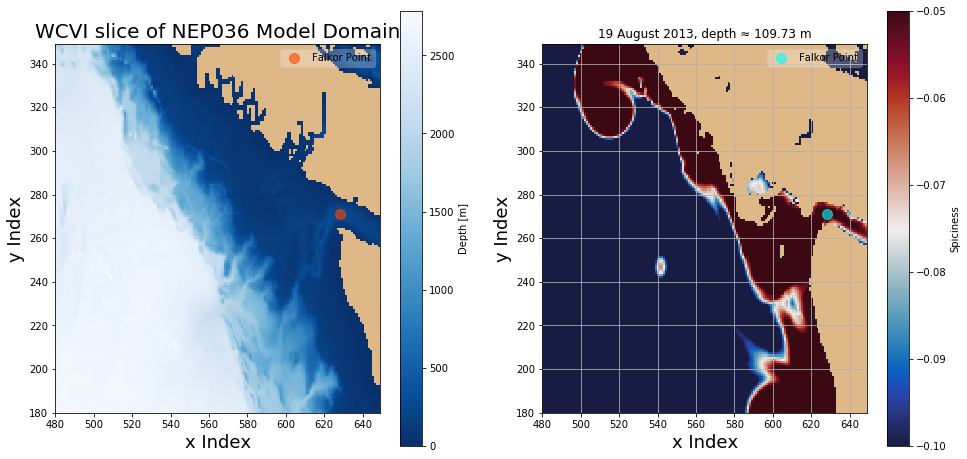

In [82]:
t = 102
level = 22
file_number = 0
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

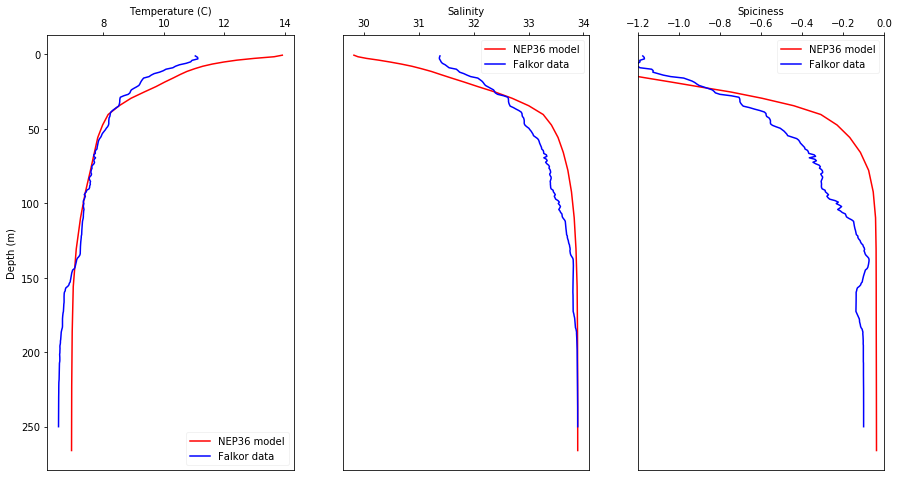

In [121]:
compare_plots(t = 102, file_number=0)

In [28]:
file_number = 0

In [31]:
y[file_number]

271

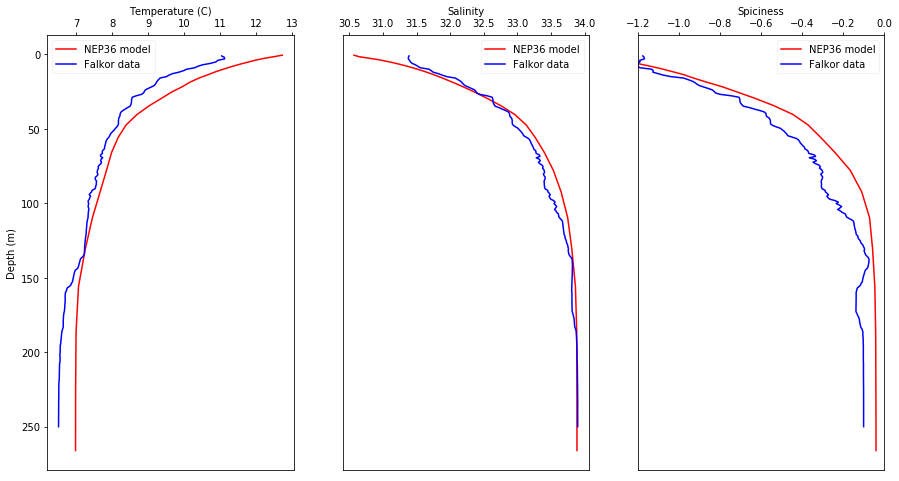

In [70]:
compare_plots(t = 112, file_number=0)

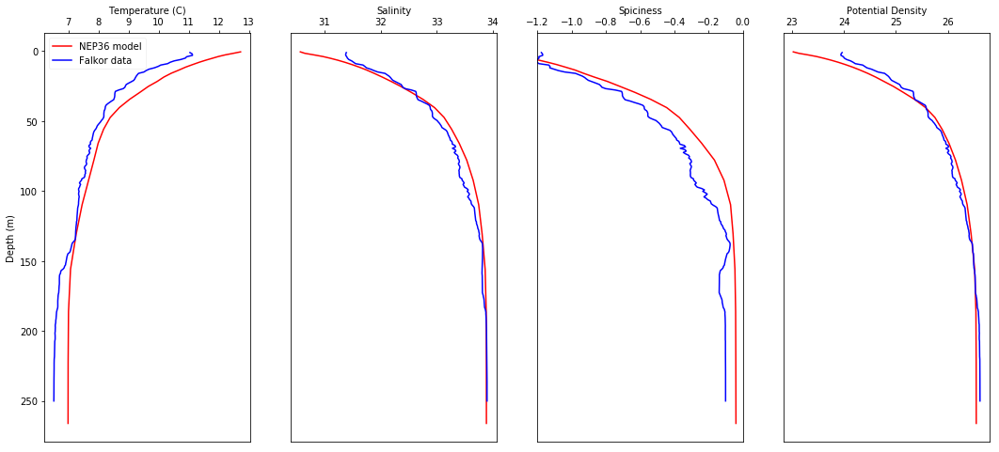

In [69]:
compare_plots_rho(t = 112, file_number=0)

/home/ssahu/saurav/Falkor_code/FK009A_CTD003_20130819.cnv


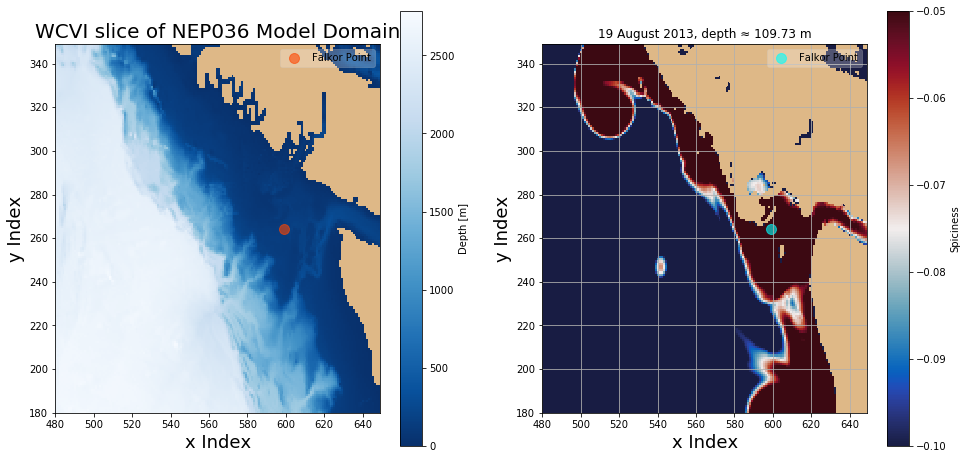

In [123]:
t = 102
level = 22
file_number = 1
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

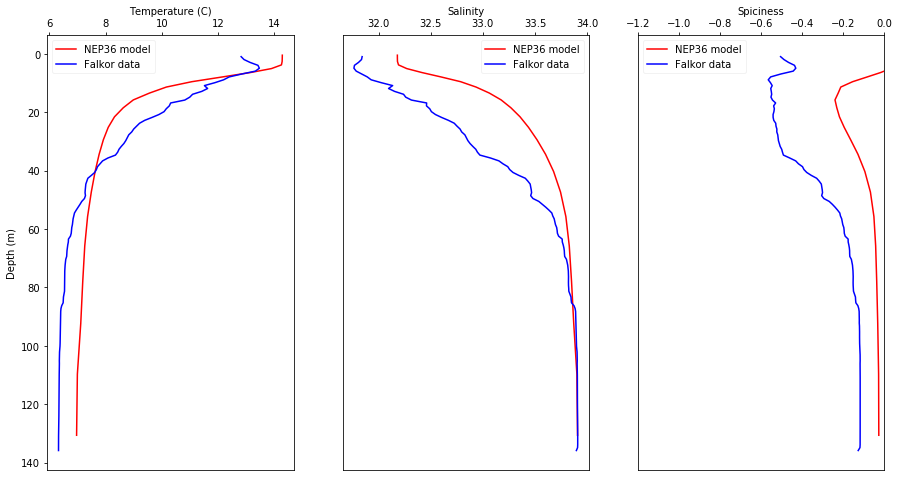

In [124]:
compare_plots(t = 102, file_number=1)

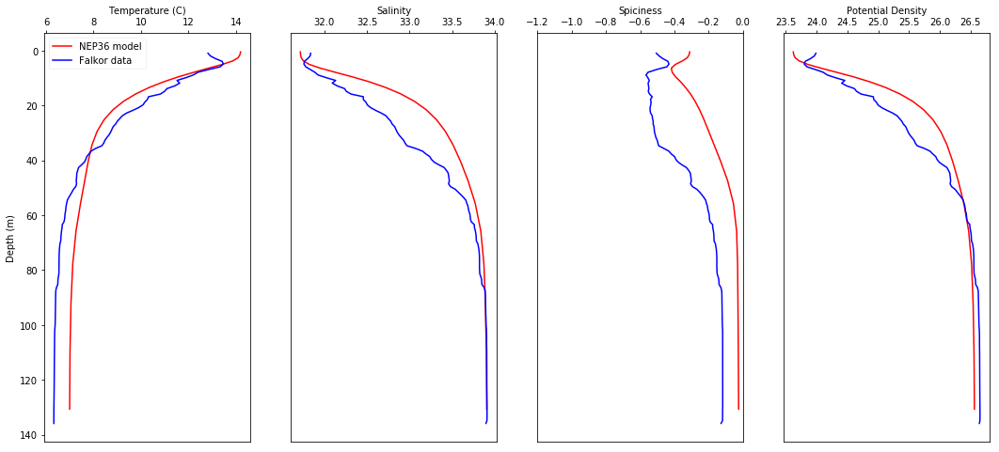

In [75]:
compare_plots_rho(t = 112, file_number=1)

/home/ssahu/saurav/Falkor_code/FK009A_CTD004_20130819.cnv


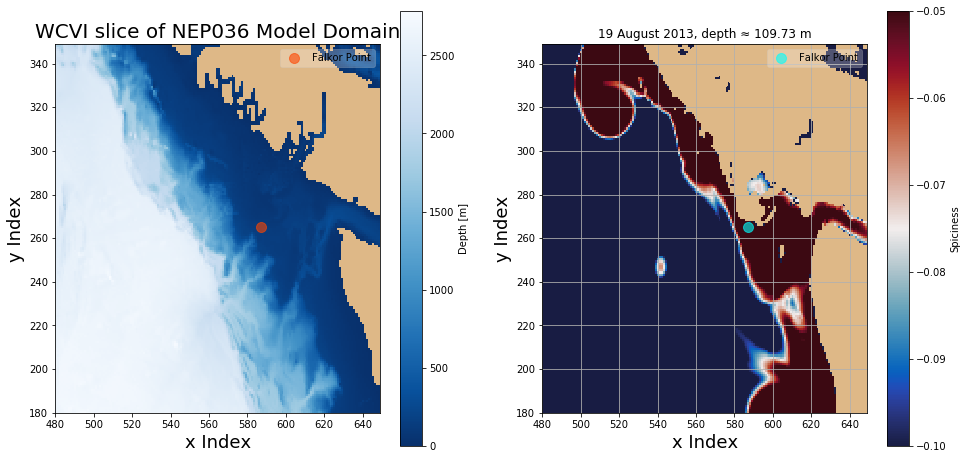

In [125]:
t = 102
level = 22
file_number = 2
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

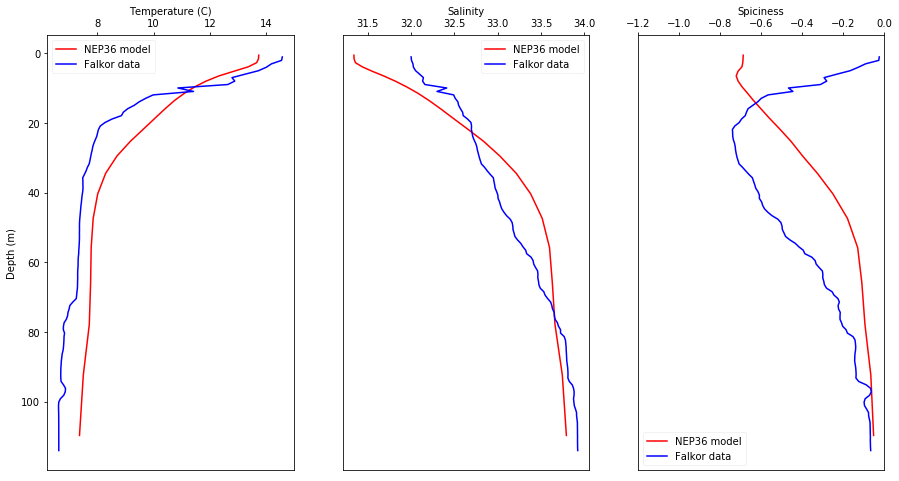

In [76]:
compare_plots(t = 112, file_number=2)

/home/ssahu/saurav/Falkor_code/FK009A_CTD005_20130820.cnv


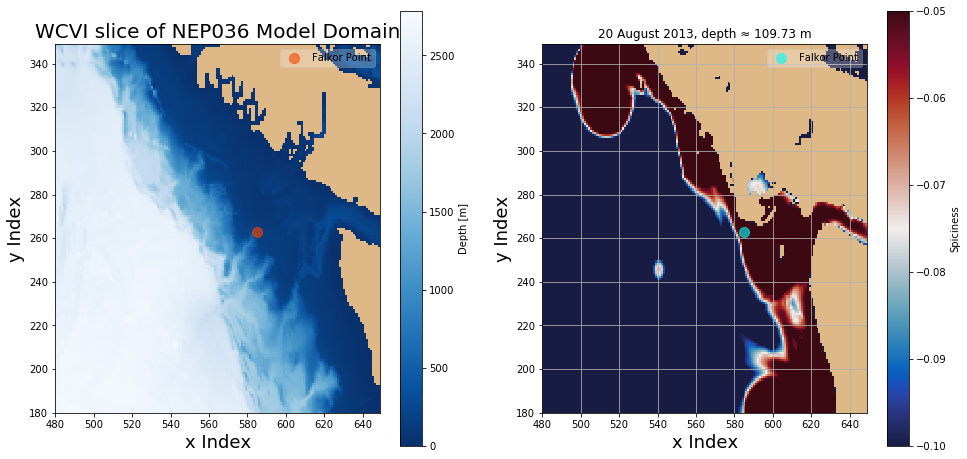

In [128]:
t = 103
level = 22
file_number = 3
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

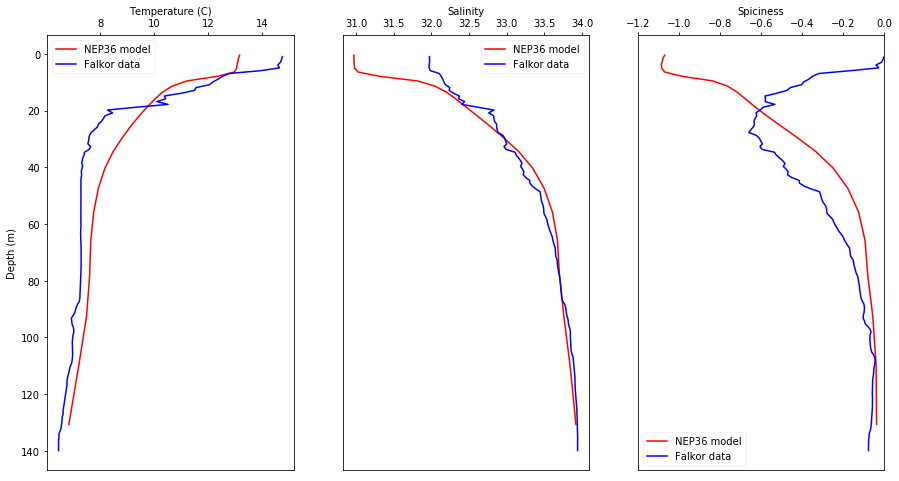

In [129]:
compare_plots(t = 103, file_number=3)

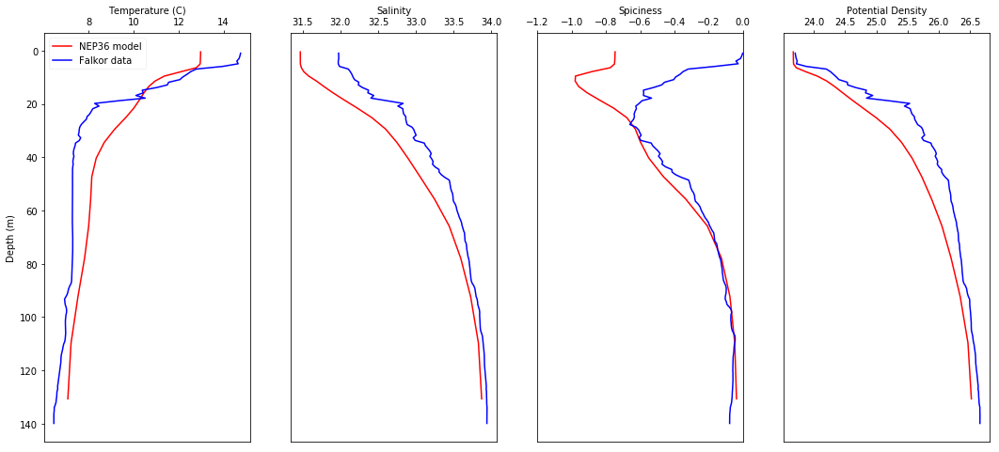

In [77]:
compare_plots_rho(t = 113, file_number=3)

/home/ssahu/saurav/Falkor_code/FK009A_CTD006_20130820.cnv


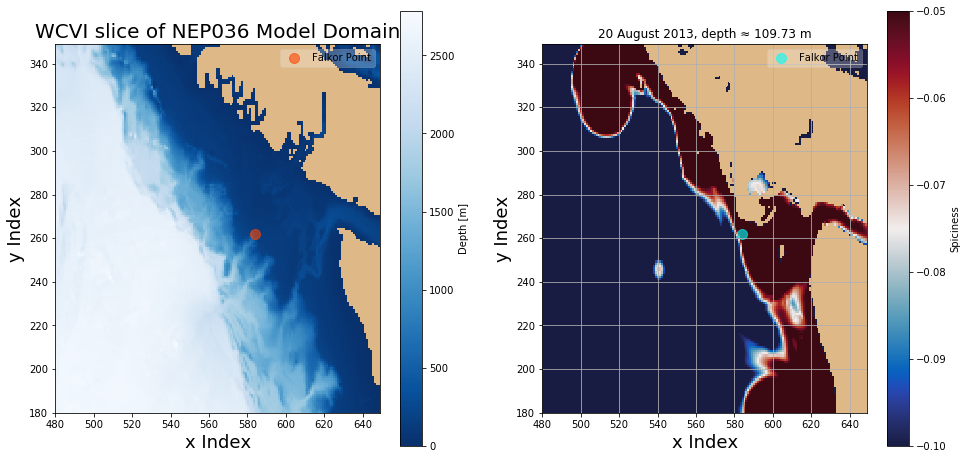

In [132]:
t = 103
level = 22
file_number = 4
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

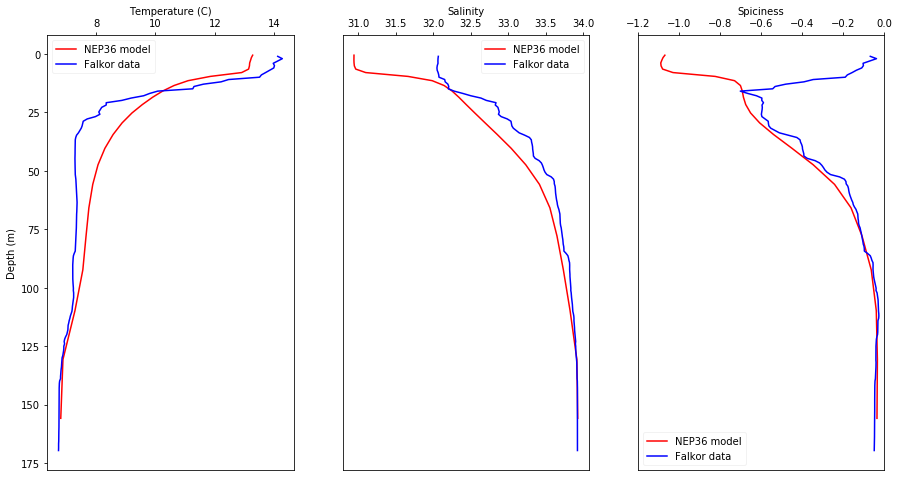

In [133]:
compare_plots(t = 103, file_number=4)

/home/ssahu/saurav/Falkor_code/FK009A_CTD007_20130820.cnv


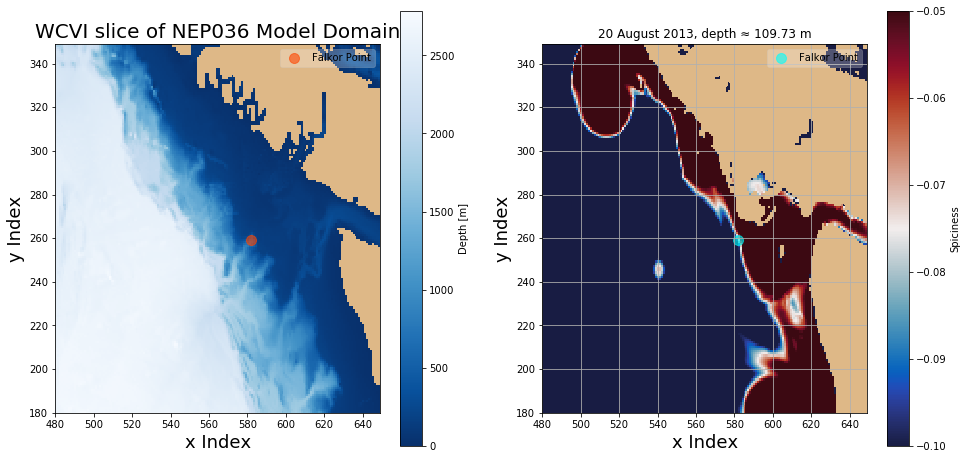

In [134]:
t = 103
level = 22
file_number = 5
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

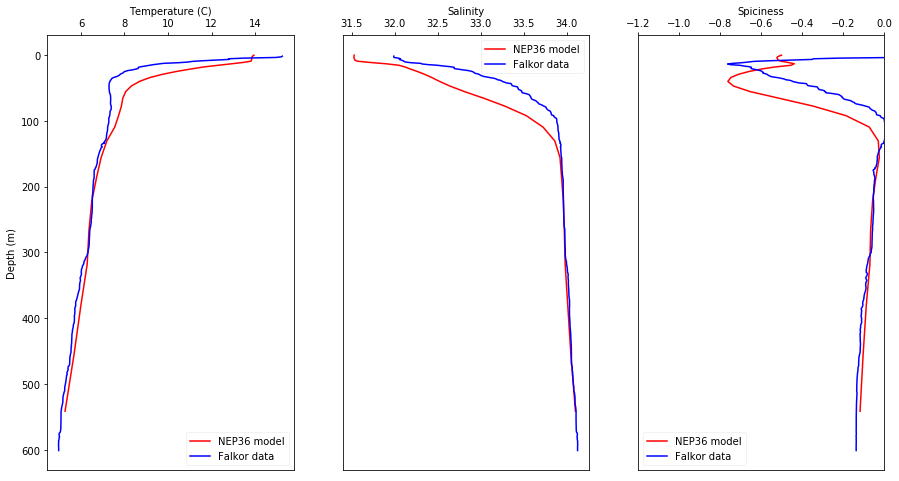

In [135]:
compare_plots(t = 103, file_number=5)

/home/ssahu/saurav/Falkor_code/FK009A_CTD008_20130820.cnv


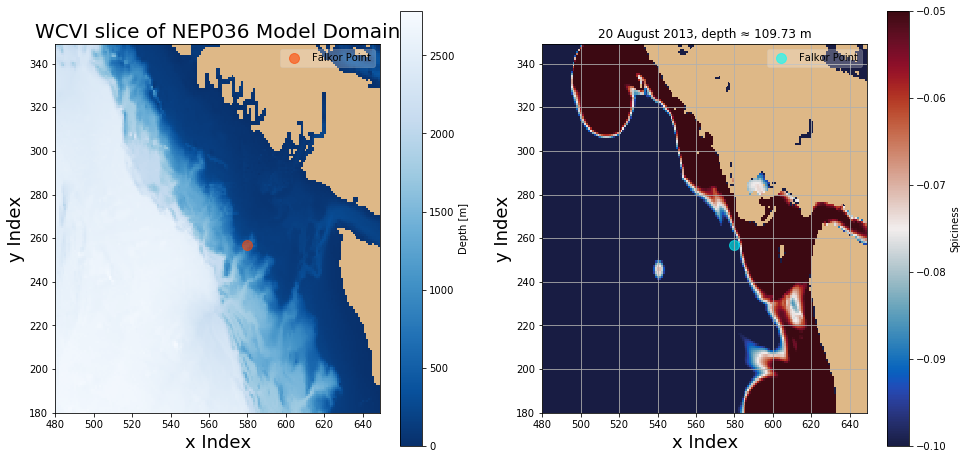

In [136]:
t = 103
level = 22
file_number = 6
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

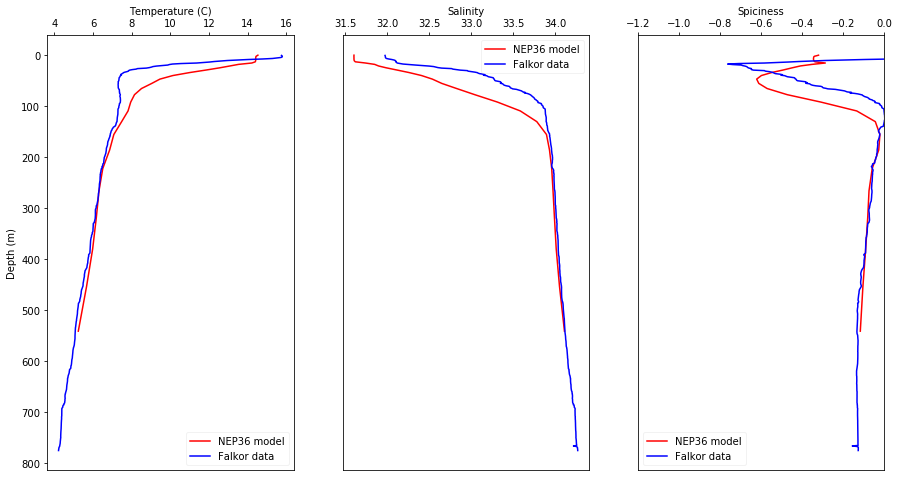

In [137]:
compare_plots(t, file_number)

/home/ssahu/saurav/Falkor_code/FK009A_CTD009_20130820.cnv


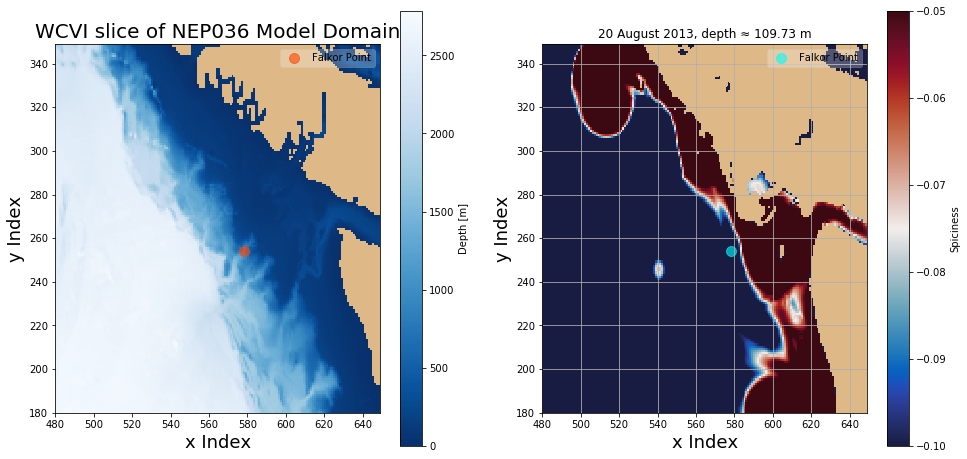

In [138]:
t = 103
level = 22
file_number = 7
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

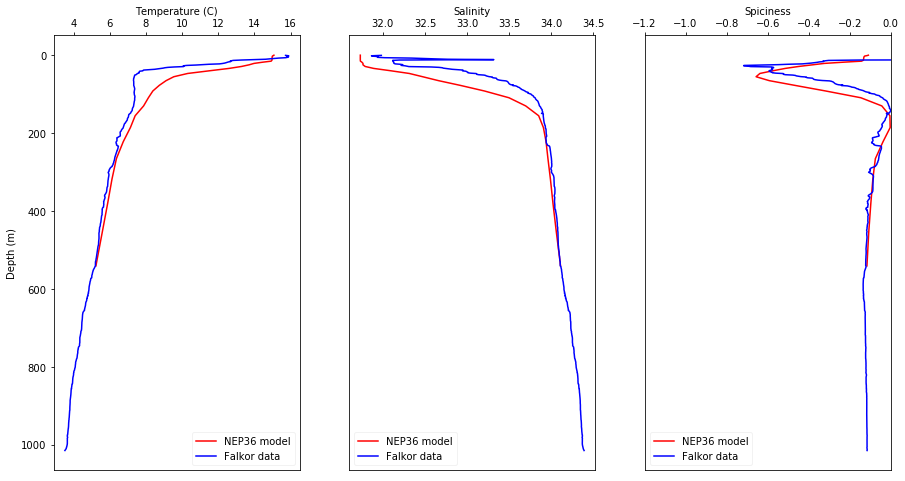

In [139]:
compare_plots(t, file_number)

/home/ssahu/saurav/Falkor_code/FK009A_CTD010_20130820.cnv


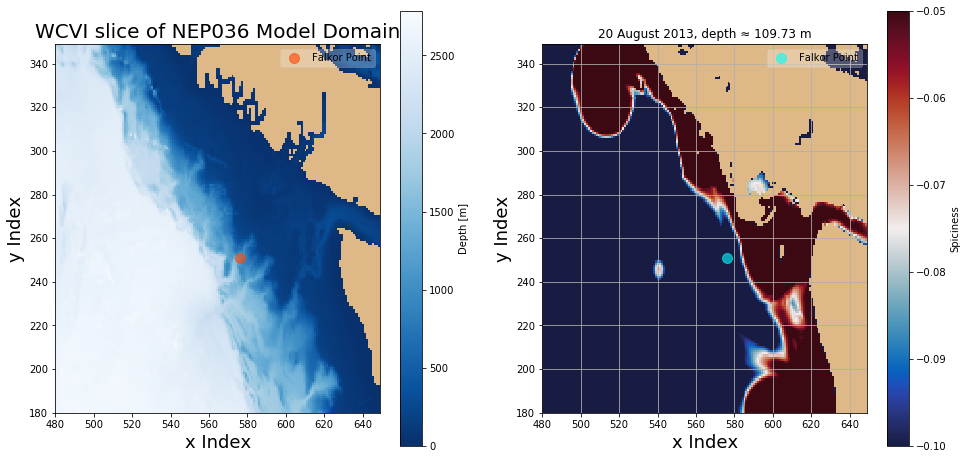

In [140]:
t = 103
level = 22
file_number = 8
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

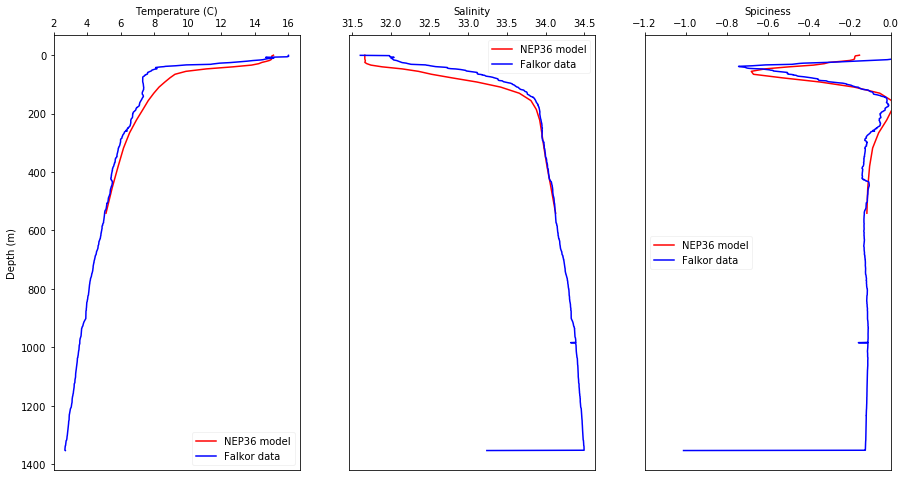

In [141]:
compare_plots(t, file_number)

/home/ssahu/saurav/Falkor_code/FK009A_CTD011_20130820.cnv


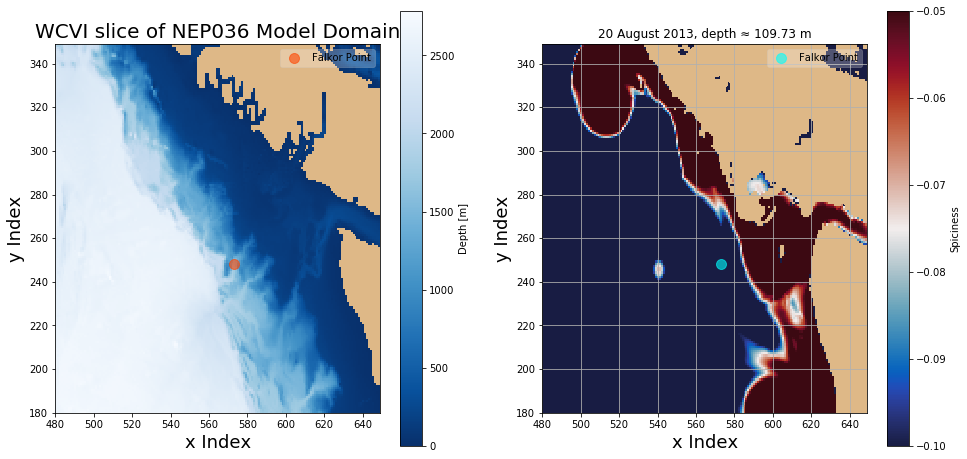

In [149]:
t = 103
level = 22
file_number = 9
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

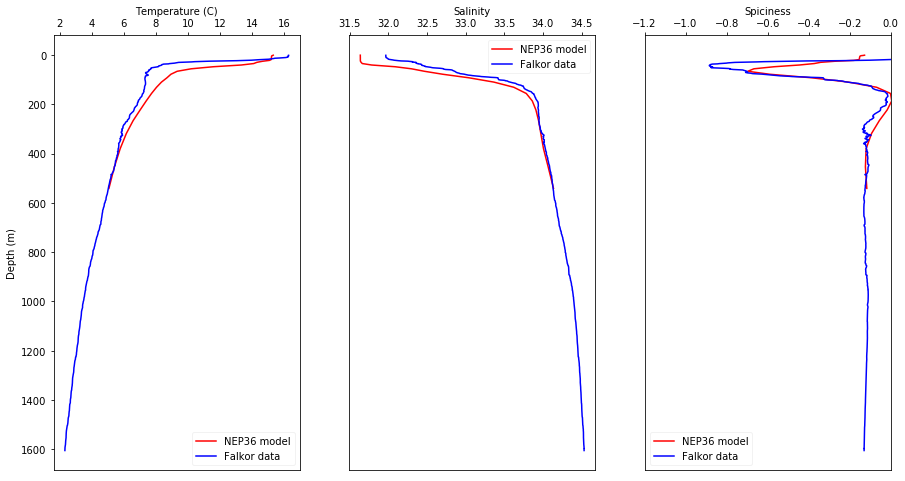

In [150]:
compare_plots(t, file_number)

/home/ssahu/saurav/Falkor_code/FK009A_CTD016_20130821.cnv


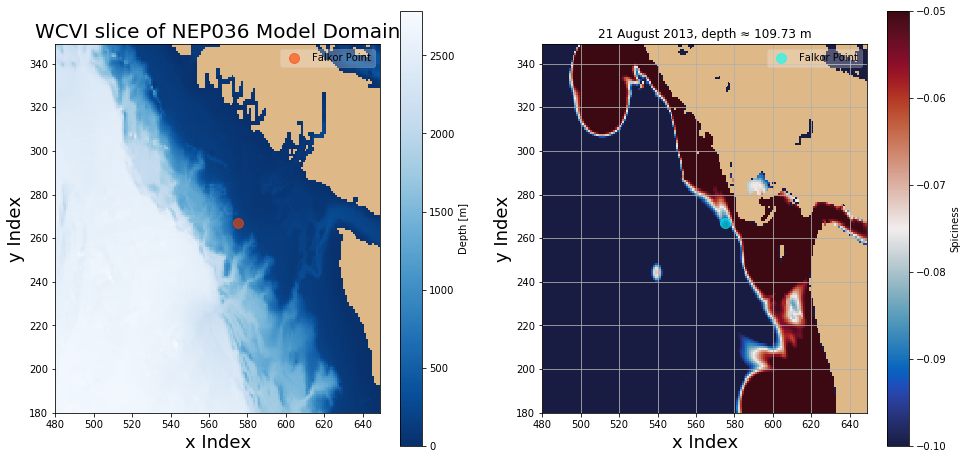

In [147]:
t = 104
level = 22
file_number = 14
print(file[file_number])



spice_bathy_plot_date(t, level, file_number)

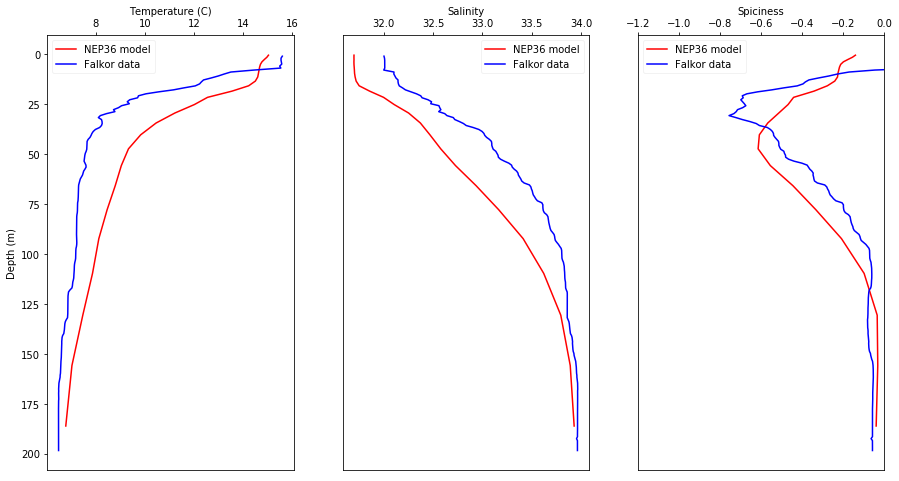

In [148]:
compare_plots(t, file_number)

In [99]:
temp_position = temp[t,:mbathy[y[file_number],x[file_number]],y[file_number],x[file_number]]

IndexError: 

In [100]:
t

102

In [101]:
temp.shape

(180, 32, 170, 170)

In [127]:
mean = np.empty((z_location.shape[0]))
for i in np.arange(z_location.shape[0]):
    mean[i] = np.mean(z_location[i])

In [129]:
mean.shape

(39,)

'599'

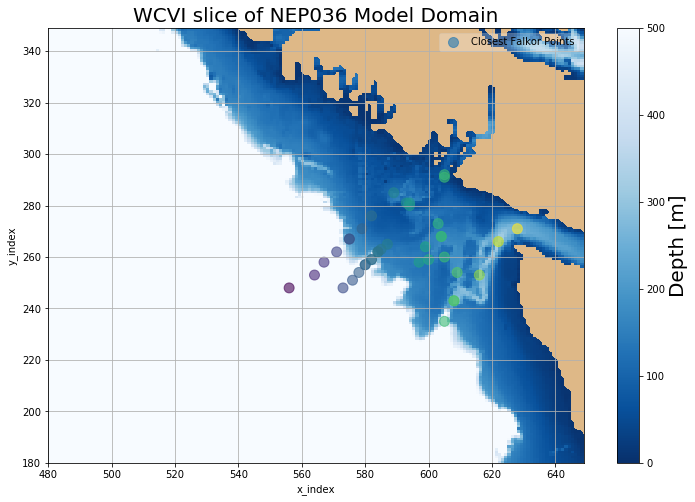

In [20]:
bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


Z = bathy.variables['Bathymetry']

y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


lon = bathy['nav_lon'][180:350, 480:650]
lat = bathy['nav_lat'][180:350, 480:650]

lon_model = bathy['nav_lon'][...]
lat_model = bathy['nav_lat'][...]

y = np.empty_like(lat_location)
x = np.empty_like(lat_location)


for i in np.arange(lat_location.shape[0]):
    y[i], x[i] = geo_tools.find_closest_model_point(
               lon_location[i],lat_location[i],lon_model,lat_model,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    
n = np.empty_like(lat_location)
m = np.empty_like(lat_location)


for i in np.arange(lat_location.shape[0]):
    n[i], m[i] = geo_tools.find_closest_model_point(
               lon_location[i],lat_location[i],lon,lat,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

y = y.astype(int)
x = x.astype(int)

n = n.astype(int)
m = m.astype(int)

cmap = plt.get_cmap('Blues_r')

cmap.set_bad('burlywood')
fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=500)

# colors = plt.cm.viridis(np.linspace(0,1,len(file)))
colors = [str(item) for item in x]

ax.scatter(x[:], y[:], c=colors, s=100, alpha=0.6, label = 'Closest Falkor Points')
legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

ax.set_xlabel('x_index')
ax.set_ylabel('y_index')
ax.set_title('WCVI slice of NEP036 Model Domain', fontsize=20)

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
cbar = fig.colorbar(p, ax=ax)
cbar.ax.set_ylabel('Depth [m]', fontsize=20)
ax.grid()

(39,)

In [76]:
model_temp_ini = []


for file_number in np.arange(len(file)):
    t = time_location[file_number]
    j = y[file_number]
    i = x[file_number]
#     model_temp = np.ma.masked_array(temp[t,:mbathy[j,i],j,i], mask= 1- tmask[:mbathy[j,i],j,i])
#     model_temp_ini = np.append(arr=model_temp_ini, values=model_temp)
    print(i,j)
    
    

628 271
599 264
587 265
585 263
584 262
582 259
580 257
578 254
576 251
573 248
556 248
564 253
567 258
571 262
575 267
579 271
582 276
605 235
608 243
604 268
603 273
594 281
593 281
605 292
589 285
575 267
616 253
608 243
580 257
582 259
584 262
605 291
594 280
604 268
597 258
600 259
605 260
609 254
622 266


In [79]:
j = y[23]

print(j)


292


masked_array(data = [ 14.32932663  13.57294273  13.02083302 ...,   7.13701582   7.12914419
   7.12205553],
             mask = False,
       fill_value = 1e+20)

In [177]:
def add_model_data_to_bin_at_station_locations(file_number, z_bin_1, z_bin_2, z_bin_3,\
                    tem_bin_1, tem_bin_2, tem_bin_3, \
                   sal_bin_1, sal_bin_2, sal_bin_3, \
                   spic_bin_1, spic_bin_2, spic_bin_3):
    
    t = time_location[file_number]
    j = n[file_number]
    i = m[file_number]
        
    model_temp_ini = temp[t,:mbathy[j,i],j,i]
    model_temp = model_temp_ini[np.nonzero(model_temp_ini)]
#     model_temp = np.ma.masked_array(model_temp_ini, mask= 1- tmask[:mbathy[j,i],j,i])

    model_sal_ini = sal[t,:mbathy[j,i],j,i]
    model_sal = model_sal_ini[np.nonzero(model_sal_ini)]

    model_spice_ini = spic[t,:mbathy[j,i],j,i]
    model_spice = model_spice_ini[np.nonzero(model_sal_ini)]

    

    z_obs = np.array(z_location[file_number])

    
    
    
    func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
    model_temp_interp = func_temp(z_obs)
    
    
    func_sal = interp1d(zlevels[:model_sal.shape[0]], model_sal, fill_value='extrapolate')
    model_sal_interp = func_sal(z_obs)
    
    func_spic = interp1d(zlevels[:model_spice.shape[0]], model_spice, fill_value='extrapolate')
    model_spice_interp = func_spic(z_obs)
    
        
    
    
       
    z_data_bin_1    = z_obs[np.where(z_obs < 60)]

    tem_data_bin_1  = model_temp_interp[np.where(z_obs < 60)]

    sal_data_bin_1  = model_sal_interp[np.where(z_obs < 60)]

    spic_data_bin_1 = model_spice_interp[np.where(z_obs < 60)]
    

    z_data_bin_2    = z_obs[np.where((z_obs >= 60) & (z_obs < 120))]

    tem_data_bin_2  = model_temp_interp[np.where((z_obs >= 60) & (z_obs < 120))]

    sal_data_bin_2  = model_sal_interp[np.where((z_obs >= 60) & (z_obs < 120))]

    spic_data_bin_2 = model_spice_interp[np.where((z_obs >= 60) & (z_obs < 120))]
    

    z_data_bin_3    = z_obs[np.where((z_obs >= 120)& (z_obs <=500))]

    tem_data_bin_3  = model_temp_interp[np.where((z_obs >= 120) & (z_obs <500))]

    sal_data_bin_3  = model_sal_interp[np.where((z_obs >= 120) & (z_obs <500))]

    spic_data_bin_3 = model_spice_interp[np.where((z_obs >= 120) & (z_obs <500))]
    
    
    z_bin_1 = np.append(arr= z_bin_1, values= z_data_bin_1)
    z_bin_2 = np.append(arr= z_bin_2, values= z_data_bin_2)
    z_bin_3 = np.append(arr= z_bin_3, values= z_data_bin_3)
    
    tem_bin_1 = np.append(arr= tem_bin_1, values= tem_data_bin_1)
    tem_bin_2 = np.append(arr= tem_bin_2, values= tem_data_bin_2)
    tem_bin_3 = np.append(arr= tem_bin_3, values= tem_data_bin_3)
    
    sal_bin_1 = np.append(arr= sal_bin_1, values= sal_data_bin_1)
    sal_bin_2 = np.append(arr= sal_bin_2, values= sal_data_bin_2)
    sal_bin_3 = np.append(arr= sal_bin_3, values= sal_data_bin_3)
    
    spic_bin_1 = np.append(arr= spic_bin_1, values= spic_data_bin_1)
    spic_bin_2 = np.append(arr= spic_bin_2, values= spic_data_bin_2)
    spic_bin_3 = np.append(arr= spic_bin_3, values= spic_data_bin_3)
    
    return z_bin_1, z_bin_2, z_bin_3, tem_bin_1, tem_bin_2, tem_bin_3, sal_bin_1, sal_bin_2, sal_bin_3, spic_bin_1, spic_bin_2, spic_bin_3
    

    
    
    
    
    

In [178]:
z_bin_1_m = []
z_bin_2_m = []
z_bin_3_m = []

tem_bin_1_m = []
tem_bin_2_m = []
tem_bin_3_m = []

sal_bin_1_m = []
sal_bin_2_m = []
sal_bin_3_m = []

spic_bin_1_m = []
spic_bin_2_m = []
spic_bin_3_m = []


for file_number in np.arange(1,len(file)-1):
    if file_number!=23:
        z_bin_1_m, z_bin_2_m, z_bin_3_m, \
        tem_bin_1_m, tem_bin_2_m,tem_bin_3_m, \
        sal_bin_1_m, sal_bin_2_m, sal_bin_3_m, \
        spic_bin_1_m, spic_bin_2_m, spic_bin_3_m = add_model_data_to_bin_at_station_locations(file_number, z_bin_1_m, z_bin_2_m, z_bin_3_m,\
                                                             tem_bin_1_m, tem_bin_2_m, tem_bin_3_m, \
                                                             sal_bin_1_m, sal_bin_2_m, sal_bin_3_m, \
                                                             spic_bin_1_m, spic_bin_2_m, spic_bin_3_m)
    


In [179]:
def add_data_to_bin(file_number, z_bin_1, z_bin_2, z_bin_3,\
                    tem_bin_1, tem_bin_2, tem_bin_3, \
                   sal_bin_1, sal_bin_2, sal_bin_3, \
                   spic_bin_1, spic_bin_2, spic_bin_3):
    



    z_data = z_location[file_number]

    tem_data = temp_location[file_number]

    sal_data = sal_location[file_number]

    spic_data = spic_falk_loc[file_number]
    
       
    z_data_bin_1    = z_data[np.where(z_data < 60)]

    tem_data_bin_1  = tem_data[np.where(z_data < 60)]

    sal_data_bin_1  = sal_data[np.where(z_data < 60)]

    spic_data_bin_1 = spic_data[np.where(z_data < 60)]
    

    z_data_bin_2    = z_data[np.where((z_data >= 60) & (z_data < 120))]

    tem_data_bin_2  = tem_data[np.where((z_data >= 60) & (z_data < 120))]

    sal_data_bin_2  = sal_data[np.where((z_data >= 60) & (z_data < 120))]

    spic_data_bin_2 = spic_data[np.where((z_data >= 60) & (z_data < 120))]
    

    z_data_bin_3    = z_data[np.where((z_data >= 120) & (z_data <500))]

    tem_data_bin_3  = tem_data[np.where((z_data >= 120)& (z_data <500))]

    sal_data_bin_3  = sal_data[np.where((z_data >= 120)& (z_data <500))]

    spic_data_bin_3 = spic_data[np.where((z_data >= 120)& (z_data <500))]
    
    
    z_bin_1 = np.append(arr= z_bin_1, values= z_data_bin_1)
    z_bin_2 = np.append(arr= z_bin_2, values= z_data_bin_2)
    z_bin_3 = np.append(arr= z_bin_3, values= z_data_bin_3)
    
    tem_bin_1 = np.append(arr= tem_bin_1, values= tem_data_bin_1)
    tem_bin_2 = np.append(arr= tem_bin_2, values= tem_data_bin_2)
    tem_bin_3 = np.append(arr= tem_bin_3, values= tem_data_bin_3)
    
    sal_bin_1 = np.append(arr= sal_bin_1, values= sal_data_bin_1)
    sal_bin_2 = np.append(arr= sal_bin_2, values= sal_data_bin_2)
    sal_bin_3 = np.append(arr= sal_bin_3, values= sal_data_bin_3)
    
    spic_bin_1 = np.append(arr= spic_bin_1, values= spic_data_bin_1)
    spic_bin_2 = np.append(arr= spic_bin_2, values= spic_data_bin_2)
    spic_bin_3 = np.append(arr= spic_bin_3, values= spic_data_bin_3)
    
    return z_bin_1, z_bin_2, z_bin_3, tem_bin_1, tem_bin_2, tem_bin_3, sal_bin_1, sal_bin_2, sal_bin_3, spic_bin_1, spic_bin_2, spic_bin_3
    

    
    
    
    
    

In [180]:
z_bin_1 = []
z_bin_2 = []
z_bin_3 = []

tem_bin_1 = []
tem_bin_2 = []
tem_bin_3 = []

sal_bin_1 = []
sal_bin_2 = []
sal_bin_3 = []

spic_bin_1 = []
spic_bin_2 = []
spic_bin_3 = []


for file_number in np.arange(1,len(file)-1):
    if file_number!=23:
        z_bin_1, z_bin_2, z_bin_3, \
        tem_bin_1, tem_bin_2,tem_bin_3, \
        sal_bin_1, sal_bin_2, sal_bin_3, \
        spic_bin_1, spic_bin_2, spic_bin_3 = add_data_to_bin(file_number, z_bin_1, z_bin_2, z_bin_3,\
                                                             tem_bin_1, tem_bin_2, tem_bin_3, \
                                                             sal_bin_1, sal_bin_2, sal_bin_3, \
                                                             spic_bin_1, spic_bin_2, spic_bin_3)


In [112]:
import seaborn as sns
from matplotlib.offsetbox import AnchoredText

def get_stat_tem(obs_temp, model_temp, z_data):
    
#     func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
#     model_temp_interp = func_temp(z_data)
    
    model_temp_interp = model_temp

    obar = np.nanmean(obs_temp)
    mprime = model_temp_interp - obar
    oprime = obs_temp - obar

    diff_sq = np.sum((model_temp_interp-obs_temp)**2)
    add_sq = np.sum((np.abs(mprime) + np.abs(oprime))**2)

    ws = 1-diff_sq/add_sq



    error = model_temp_interp - obs_temp
    gamma2 = np.var(error)/np.var(obs_temp)
    mean_error = np.mean(error)
    mean_abs_error = np.mean(np.abs(error))
    rms_error = np.sqrt(np.mean(error**2))
    
    return gamma2,rms_error,ws

def get_stat_sal(obs_sal, model_sal, z_data):
    
#     func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
#     model_temp_interp = func_temp(z_data)
    
    model_temp_interp = model_sal
    obs_temp = obs_sal

    obar = np.nanmean(obs_temp)
    mprime = model_temp_interp - obar
    oprime = obs_temp - obar

    diff_sq = np.sum((model_temp_interp-obs_temp)**2)
    add_sq = np.sum((np.abs(mprime) + np.abs(oprime))**2)

    ws = 1-diff_sq/add_sq



    error = model_temp_interp - obs_temp
    gamma2 = np.var(error)/np.var(obs_temp)
    mean_error = np.mean(error)
    mean_abs_error = np.mean(np.abs(error))
    rms_error = np.sqrt(np.mean(error**2))
    
    return gamma2,rms_error,ws

def get_stat_spice(obs_spice, model_spice, z_data):
    
#     func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
#     model_temp_interp = func_temp(z_data)
    
    model_temp_interp = model_spice
    obs_temp = obs_spice

    obar = np.nanmean(obs_temp)
    mprime = model_temp_interp - obar
    oprime = obs_temp - obar

    diff_sq = np.sum((model_temp_interp-obs_temp)**2)
    add_sq = np.sum((np.abs(mprime) + np.abs(oprime))**2)

    ws = 1-diff_sq/add_sq



    error = model_temp_interp - obs_temp
    gamma2 = np.var(error)/np.var(obs_temp)
    mean_error = np.mean(error)
    mean_abs_error = np.mean(np.abs(error))
    rms_error = np.sqrt(np.mean(error**2))
    
    return gamma2,rms_error,ws



def plot_stat_bin_1(obs_temp, model_temp, obs_sal, model_sal, obs_spice, model_spice, z_data):

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (20,20))




    gamma2,rms_error,ws = get_stat_tem(obs_temp, model_temp, z_data)
    df =pd.DataFrame()
    df['Observed_temp'] = obs_temp
    df['Model_temp'] = model_temp
    sns.regplot(x="Observed_temp", y="Model_temp", data=df, color='teal', ax=ax1, fit_reg=False)
    ax1.set_title('Model vs Observed Temperature for Bin 1 (< 50m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax1.add_artist(anchored_text)
    lims = [
        np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
        np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
    ]
    ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax1.set_aspect('equal')
    ax1.set_xlim(lims)
    ax1.set_ylim(lims)



    gamma2,rms_error,ws = get_stat_sal(obs_sal, model_sal, z_data)
    df =pd.DataFrame()
    df['Observed_Salinity'] = obs_sal
    df['Model_Salinity'] = model_sal
    sns.regplot(x="Observed_Salinity", y="Model_Salinity", data=df, color='blue', ax = ax2, fit_reg=False)
    ax2.set_title('Model vs Observed Salinity for Bin 1 (< 50m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax2.add_artist(anchored_text)
    lims = [
        np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
        np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
    ]

    ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax2.set_aspect('equal')
    ax2.set_xlim(lims)
    ax2.set_ylim(lims)


    gamma2,rms_error,ws = get_stat_spice(obs_spice, model_spice, z_data)
    df =pd.DataFrame()
    df['Observed_Spice'] = obs_spice
    df['Model_Spice'] = model_spice
    sns.regplot(x="Observed_Spice", y="Model_Spice", data=df, color='orangered', ax = ax3, fit_reg=False)
    ax3.set_title('Model vs Observed Spice for Bin 1 (< 50m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax3.add_artist(anchored_text)
    lims = [
        np.min([ax3.get_xlim(), ax3.get_ylim()]),  # min of both axes
        np.max([ax3.get_xlim(), ax3.get_ylim()]),  # max of both axes
    ]

    ax3.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax3.set_aspect('equal')
    ax3.set_xlim(lims)
    ax3.set_ylim(lims)

    
    
def plot_stat_bin_2(obs_temp, model_temp, obs_sal, model_sal, obs_spice, model_spice, z_data):

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (20,20))




    gamma2,rms_error,ws = get_stat_tem(obs_temp, model_temp, z_data)
    df =pd.DataFrame()
    df['Observed_temp'] = obs_temp
    df['Model_temp'] = model_temp
    
        

    Depths = np.empty_like(z_bin_2)
    Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
    Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
    df['Z'] = Depths
    df['D'] = z_bin_2[:]

    p = sns.lmplot(x="Observed_temp", y="Model_temp", hue="Z",  legend_out=False, data=df,  fit_reg=False)
    ax1 = p.axes[0,0]
    p.axes[0, 0].set_title('Model vs Observed Temperature for Bin 1 (50m < z < 100m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=4)
    p.axes[0, 0].add_artist(anchored_text)
    leg = p.axes[0, 0].get_legend()
    leg.set_title(None)
    labs = leg.texts
    labs[0].set_text("(50-75)m")
    labs[1].set_text("(75 - 100)m")
    lims = [
        np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
        np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
    ]
    p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)

    p.axes[0, 0].set_aspect('equal')
    p.axes[0, 0].set_xlim(lims)
    p.axes[0, 0].set_ylim(lims)



    gamma2,rms_error,ws = get_stat_sal(obs_sal, model_sal, z_data)
    df =pd.DataFrame()
    df['Observed_Salinity'] = obs_sal
    df['Model_Salinity'] = model_sal    
    sns.regplot(x="Observed_Salinity", y="Model_Salinity", data=df, color='blue', ax = ax2, fit_reg=False)
    ax2.set_title('Model vs Observed Salinity for Bin 2 (50m < z < 100m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax2.add_artist(anchored_text)
    lims = [
        np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
        np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
    ]

    ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax2.set_aspect('equal')
    ax2.set_xlim(lims)
    ax2.set_ylim(lims)


    gamma2,rms_error,ws = get_stat_spice(obs_spice, model_spice, z_data)
    df =pd.DataFrame()
    df['Observed_Spice'] = obs_spice
    df['Model_Spice'] = model_spice
    sns.regplot(x="Observed_Spice", y="Model_Spice", data=df, color='orangered', ax = ax3, fit_reg=False)
    ax3.set_title('Model vs Observed Spice for Bin 1 (50m < z < 100m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax3.add_artist(anchored_text)
    lims = [
        np.min([ax3.get_xlim(), ax3.get_ylim()]),  # min of both axes
        np.max([ax3.get_xlim(), ax3.get_ylim()]),  # max of both axes
    ]

    ax3.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax3.set_aspect('equal')
    ax3.set_xlim(lims)
    ax3.set_ylim(lims)

def plot_stat_bin_3(obs_temp, model_temp, obs_sal, model_sal, obs_spice, model_spice, z_data):

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (20,20))




    gamma2,rms_error,ws = get_stat_tem(obs_temp, model_temp, z_data)
    df =pd.DataFrame()
    df['Observed_temp'] = obs_temp
    df['Model_temp'] = model_temp
    sns.regplot(x="Observed_temp", y="Model_temp", data=df, color='teal', ax=ax1, fit_reg=False)
    ax1.set_title('Model vs Observed Temperature for Bin 3 (z > 100m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax1.add_artist(anchored_text)
    lims = [
        np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
        np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
    ]
    ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax1.set_aspect('equal')
    ax1.set_xlim(lims)
    ax1.set_ylim(lims)



    gamma2,rms_error,ws = get_stat_sal(obs_sal, model_sal, z_data)
    df =pd.DataFrame()
    df['Observed_Salinity'] = obs_sal
    df['Model_Salinity'] = model_sal
    sns.regplot(x="Observed_Salinity", y="Model_Salinity", data=df, color='blue', ax = ax2, fit_reg=False)
    ax2.set_title('Model vs Observed Salinity for Bin 3 (z > 100m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax2.add_artist(anchored_text)
    lims = [
        np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
        np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
    ]

    ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax2.set_aspect('equal')
    ax2.set_xlim(lims)
    ax2.set_ylim(lims)


    gamma2,rms_error,ws = get_stat_spice(obs_spice, model_spice, z_data)
    df =pd.DataFrame()
    df['Observed_Spice'] = obs_spice
    df['Model_Spice'] = model_spice
    sns.regplot(x="Observed_Spice", y="Model_Spice", data=df, color='orangered', ax = ax3, fit_reg=False)
    ax3.set_title('Model vs Observed Spice for Bin 3 (z > 100m)')
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),loc=2)
    ax3.add_artist(anchored_text)
    lims = [
        np.min([ax3.get_xlim(), ax3.get_ylim()]),  # min of both axes
        np.max([ax3.get_xlim(), ax3.get_ylim()]),  # max of both axes
    ]

    ax3.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax3.set_aspect('equal')
    ax3.set_xlim(lims)
    ax3.set_ylim(lims)




In [186]:
np.where(spic_bin_2_m==np.max(spic_bin_2_m))

(array([1739]),)

In [110]:
df =pd.DataFrame()
df['Observed_temp'] = tem_bin_2
df['Model_temp'] = tem_bin_2_m
df['Observed_Salinity'] = sal_bin_2
df['Model_Salinity'] = sal_bin_2_m
df['Observed_Spice'] = spic_bin_2
df['Model_Spice'] = spic_bin_2_m


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = z_bin_2[:]

In [15]:
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np

class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):

        self.sg.fig.set_size_inches(self.fig.get_size_inches())

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


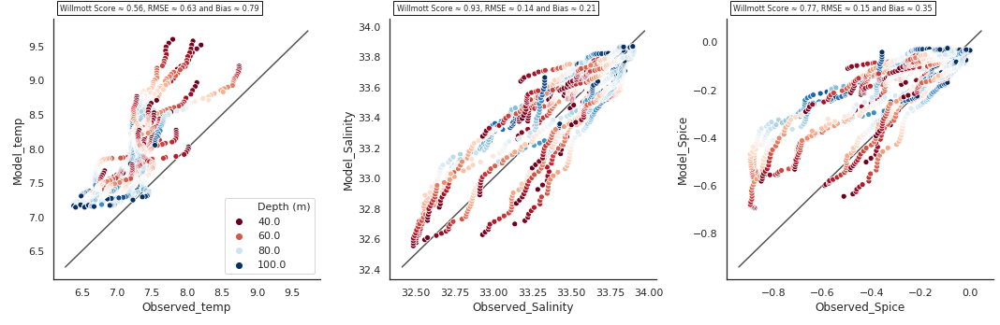

In [181]:

import seaborn as sns
import matplotlib.gridspec as gridspec
# import SeabornFig2Grid as sfg

# %matplotlib inline
# sns.set(rc={'figure.figsize':(60.0, 60.0)})
sns.set(style="white")
# plt.figure(figsize=(60,60))

# current_palette = sns.color_palette()
# cmap = sns.palplot(current_palette)
# cmap = sns.choose_diverging_palette("D")

# p = sns.FacetGrid(df)
p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df, legend='brief',palette=cm.RdBu)
q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.RdBu)#, palette=cmap)
g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.RdBu)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")
# leg.set_title(Depth)
# labs = leg.texts
# labs[0].set_text("(50-75)m")
# labs[1].set_text("(75 - 100)m")
lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(tem_bin_2, tem_bin_2_m, z_bin_2)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(sal_bin_2, sal_bin_2_m, z_bin_2)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=q.axes[0,0].transAxes
                       )
q.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]

g.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(spic_bin_2, spic_bin_2_m, z_bin_2)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=g.axes[0,0].transAxes
                       )
g.axes[0,0].add_artist(anchored_text)
# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 3)
mg0 = SeabornFig2Grid(p, fig, gs[0])
mg1 = SeabornFig2Grid(q, fig, gs[1])
mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


In [190]:
def plot_stat_bin(bin_number):
    if bin_number == 'bin1':
        obs_temp    = tem_bin_1 
        model_temp  = tem_bin_1_m
        obs_sal     = sal_bin_1
        model_sal   = sal_bin_1_m
        obs_spice   = spic_bin_1
        model_spice = spic_bin_1_m 
        z_data      = z_bin_1
        
    if bin_number == 'bin2':
        obs_temp    = tem_bin_2 
        model_temp  = tem_bin_2_m
        obs_sal     = sal_bin_2
        model_sal   = sal_bin_2_m
        obs_spice   = spic_bin_2
        model_spice = spic_bin_2_m 
        z_data      = z_bin_2
        
    if bin_number == 'bin3':
        obs_temp    = tem_bin_3 
        model_temp  = tem_bin_3_m
        obs_sal     = sal_bin_3
        model_sal   = sal_bin_3_m
        obs_spice   = spic_bin_3
        model_spice = spic_bin_3_m 
        z_data      = z_bin_3
        
    df =pd.DataFrame()
    df['Observed_temp'] = obs_temp
    df['Model_temp'] = model_temp
    df['Observed_Salinity'] = obs_sal
    df['Model_Salinity'] = model_sal
    df['Observed_Spice'] = obs_spice
    df['Model_Spice'] = model_spice
    
    if bin_number == 'bin1':
        df["Depth (m)"] = z_bin_1
        
    if bin_number == 'bin2':
        df["Depth (m)"] = z_bin_2
        
    if bin_number == 'bin3':
        df["Depth (m)"] = z_bin_3
        
    sns.set(style="white")
#     plt.figure(figsize=(60,60))
    p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df,palette=cm.plasma_r)
    q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.RdBu)#, palette=cmap)
    g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.plasma_r)#, palette=cmap)
    leg = p.axes[0, 0].get_legend()
    p.axes[0,0].legend(loc="best")
    leg = q.axes[0, 0].get_legend()
    q.axes[0,0].legend(loc="best")
    # leg.set_title(Depth)
    # labs = leg.texts
    # labs[0].set_text("(50-75)m")
    # labs[1].set_text("(75 - 100)m")
    lims = [
        np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
        np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
    ]

    p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    gamma2,rms_error,ws = get_stat_tem(obs_temp, model_temp, z_data)
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                           bbox_to_anchor=(0., 1.),
                           bbox_transform=p.axes[0,0].transAxes
                           )
    p.axes[0,0].add_artist(anchored_text)

    lims = [
        np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
        np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
    ]

    q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    gamma2,rms_error,ws = get_stat_sal(obs_sal, model_sal, z_data)
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                           bbox_to_anchor=(0., 1.),
                           bbox_transform=q.axes[0,0].transAxes
                           )
    q.axes[0,0].add_artist(anchored_text)

    lims = [
        np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
        np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
    ]

    g.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    gamma2,rms_error,ws = get_stat_spice(obs_spice, model_spice, z_data)
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                           bbox_to_anchor=(0., 1.),
                           bbox_transform=g.axes[0,0].transAxes
                           )
    g.axes[0,0].add_artist(anchored_text)
    # labs[2].set_text("Type 2")
    # labs[3].set_text("Type 3")

    # fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

    # fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
    fig = plt.figure(figsize=(15,5))
    gs = gridspec.GridSpec(1, 3)
    mg0 = SeabornFig2Grid(p, fig, gs[0])
    mg1 = SeabornFig2Grid(q, fig, gs[1])
    mg2 = SeabornFig2Grid(g, fig, gs[2])

    # mg3 = SeabornFig2Grid(p, fig, gs[3])

    # plt.show()
    gs.tight_layout(fig)




Model vs Observed (0 to 50m)


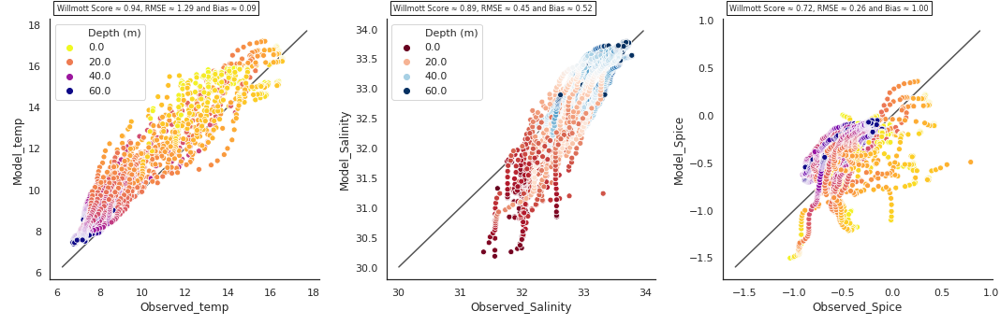

In [203]:
print("Model vs Observed (0 to 50m)")
plot_stat_bin('bin1')

Model vs Observed for Bin 2 (60m to 120m)


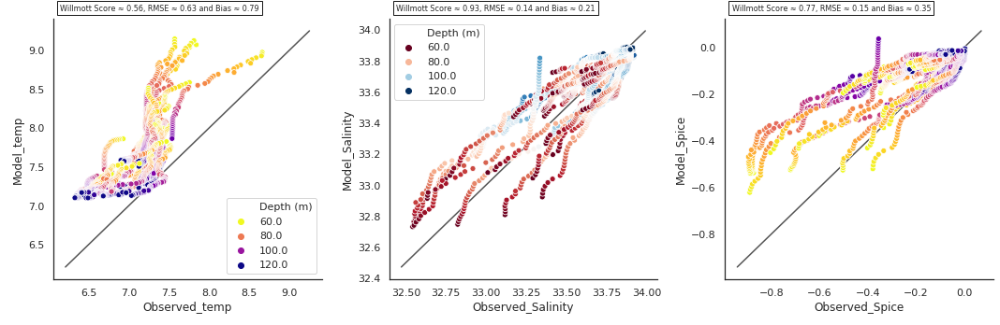

In [202]:
print('Model vs Observed for Bin 2 (60m to 120m)')
plot_stat_bin('bin2')

Model vs Observed (120m to 500m)


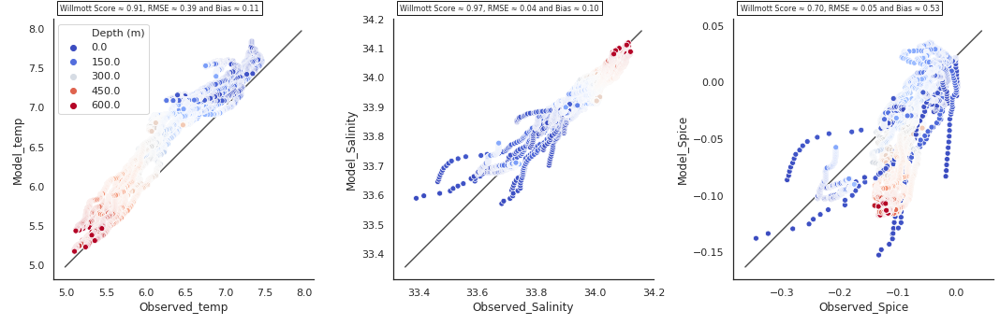

In [204]:
print("Model vs Observed (120m to 500m)")

df =pd.DataFrame()
df['Observed_temp'] = tem_bin_3
df['Model_temp'] = tem_bin_3_m
df['Observed_Salinity'] = sal_bin_3
df['Model_Salinity'] = sal_bin_3_m
df['Observed_Spice'] = spic_bin_3
df['Model_Spice'] = spic_bin_3_m


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = z_bin_3[:]

p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df, legend='brief',palette=cm.coolwarm)
q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.coolwarm)#, palette=cmap)
g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.coolwarm)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(tem_bin_3, tem_bin_3_m, z_bin_3)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(sal_bin_3, sal_bin_3_m, z_bin_3)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=q.axes[0,0].transAxes
                       )
q.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]

lims3 = [
    np.min([g.axes[0,0].get_ylim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]


g.axes[0,0].plot(lims, lims3, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(spic_bin_3, spic_bin_3_m, z_bin_3)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=g.axes[0,0].transAxes
                       )
g.axes[0,0].add_artist(anchored_text)
# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 3)
mg0 = SeabornFig2Grid(p, fig, gs[0])
mg1 = SeabornFig2Grid(q, fig, gs[1])
mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


In [ ]:
df = pd.DataFrame({'x':x,
                   'y':y,
                   'category1':category1,
                   'category2':category2})
df.loc[df.category1==1, 'y'] *= 2

In [149]:
np.max(z_bin_3)

499.3919986783344

In [167]:
colors = mpl.colors.Colormap(cm.BrBG, N=z_bin_2.shape[0])

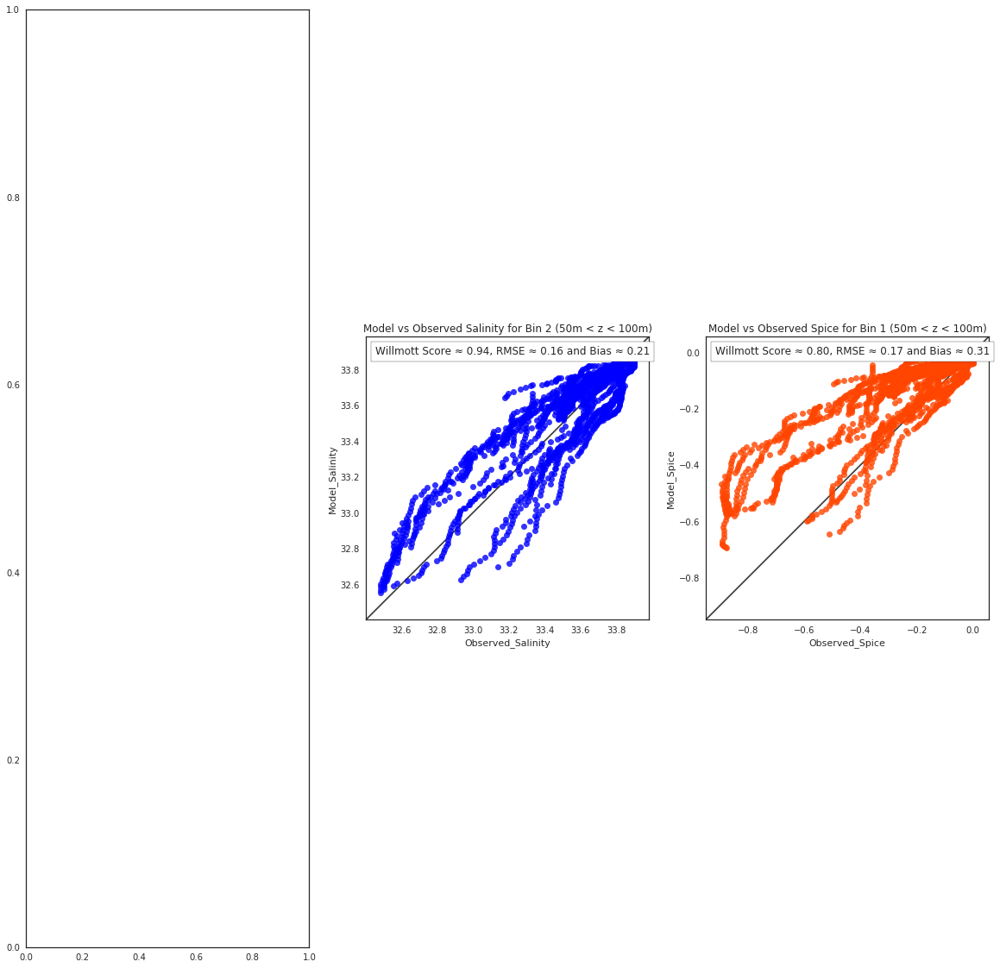

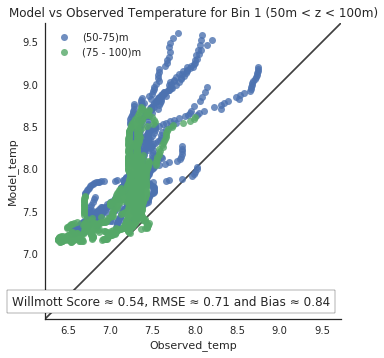

In [51]:

plot_stat_bin_2(obs_temp=tem_bin_2, model_temp=tem_bin_2_m, obs_sal=sal_bin_2, model_sal= sal_bin_2_m, \
          obs_spice= spic_bin_2, model_spice= spic_bin_2_m, z_data= z_bin_2)

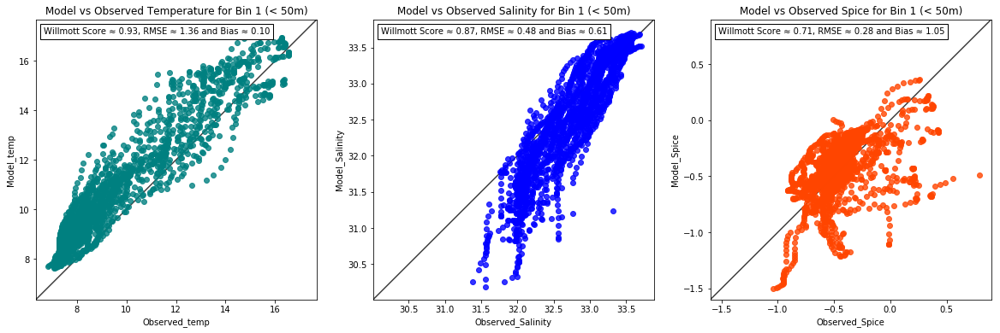

In [84]:
plot_stat_bin_1(obs_temp=tem_bin_1, model_temp=tem_bin_1_m, obs_sal=sal_bin_1, model_sal= sal_bin_1_m, \
          obs_spice= spic_bin_1, model_spice= spic_bin_1_m, z_data= z_bin_1)

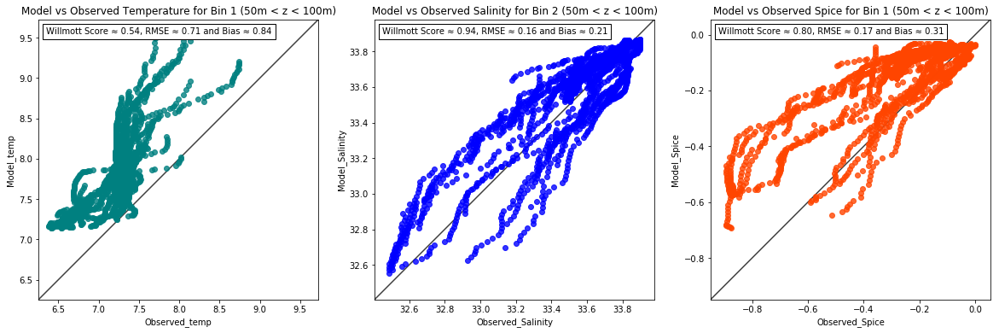

In [85]:
plot_stat_bin_2(obs_temp=tem_bin_2, model_temp=tem_bin_2_m, obs_sal=sal_bin_2, model_sal= sal_bin_2_m, \
          obs_spice= spic_bin_2, model_spice= spic_bin_2_m, z_data= z_bin_2)

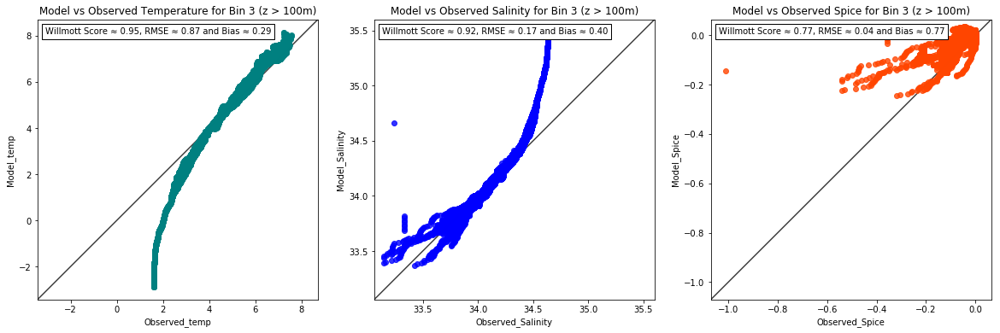

In [172]:
plot_stat_bin_3(obs_temp=tem_bin_3, model_temp=tem_bin_3_m, obs_sal=sal_bin_3, model_sal= sal_bin_3_m, \
          obs_spice= spic_bin_3, model_spice= spic_bin_3_m, z_data= z_bin_3)

In [94]:
z_a = z_a[~z_a.mask]

In [182]:
z_bin_2

masked_array(data = [  60.49483425   61.48670232   62.47857522 ...,  117.04067453  118.03283189
  119.02499409],
             mask = False,
       fill_value = 1e+20)

In [74]:
zlevels.shape

(32,)

In [146]:
j = n[23]
i = m[23]
t = time_location[23]

temp_model = temp[t,:mbathy[j,i],j,i]
xxx = temp_model[np.nonzero(temp_model)]

In [149]:
temp_model

array([ 14.20641804,  13.64383698,  13.15037823,  12.94843578,
        12.78422165,  12.66473293,  12.53901005,  12.42774487,
        12.26917648,  12.16601849,  11.98970413,  11.9142065 ,
        11.61143494,  11.25860596,   0.        ], dtype=float32)

In [143]:
zlevels[:mbathy[j,i]].shape

(15,)

In [144]:
temp_model.shape

(15,)

In [126]:
time_location

array([131, 131, 131, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132,
       132, 133, 133, 133, 134, 134, 134, 134, 134, 134, 134, 135, 135,
       135, 136, 137, 138, 138, 138, 138, 139, 139, 139, 139, 139, 142])

In [66]:
np.max(mbathy)

43

In [88]:
np.max(tem_bin_2_m)

9.6014781255948733